<h1>Trabalho transfer learning</h1>

In [1]:
import pandas as pd
import os
from glob import glob  # Pattern matching file path
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import gc
from sklearn.utils import resample


import tensorflow as tf
import kagglehub


from tensorflow.keras.preprocessing.image import ImageDataGenerator

2024-12-12 01:29:35.805605: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-12 01:29:35.828033: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-12 01:29:35.834742: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-12 01:29:35.852268: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-12 01:29:36.902695: W tensorflow/compiler/tf2

In [2]:
num_epochs = 150
base_path = "/home/mlima/workspace"

In [3]:
import random
def set_seed(seed=42):
  np.random.seed(seed) 
  tf.random.set_seed(seed) 
  random.seed(seed)
set_seed()

In [4]:
# Download latest version
path_skin_cancer = kagglehub.dataset_download("kmader/skin-cancer-mnist-ham10000")

print("Path to dataset files:", path_skin_cancer)

Path to dataset files: /home/mlima/.cache/kagglehub/datasets/kmader/skin-cancer-mnist-ham10000/versions/2


In [5]:
df_skin_cancer = pd.read_csv(path_skin_cancer + '/HAM10000_metadata.csv', delimiter=',')
df_skin_cancer.dataframeName = 'HAM10000_metadata.csv'
nRow, nCol = df_skin_cancer.shape
print(f'There are {nRow} rows and {nCol} columns')
df_skin_cancer.head(5)

There are 10015 rows and 7 columns


,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [6]:
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(path_skin_cancer, '*', '*.jpg'))}

In [7]:
lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

df_skin_cancer['path'] = df_skin_cancer['image_id'].map(imageid_path_dict.get)
df_skin_cancer['cell_type'] = df_skin_cancer['dx'].map(lesion_type_dict.get)

<h1>Visualizações</h1>

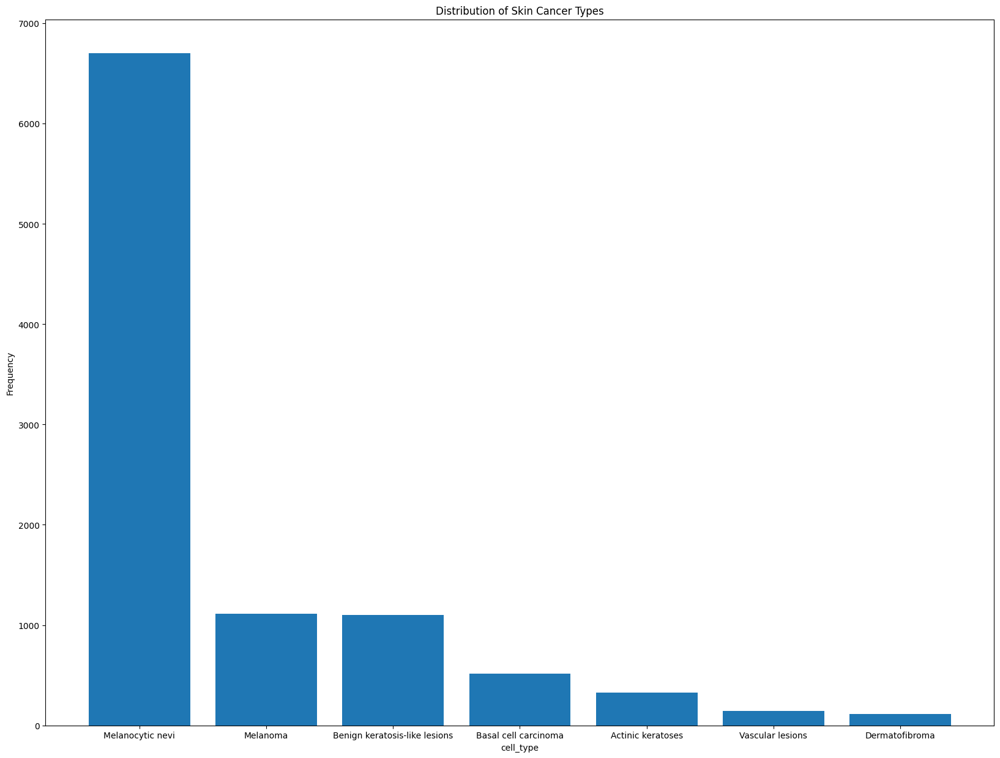

In [8]:
# @title Distribution of Skin Cancer Types


# Assuming your DataFrame is named 'df_skin_cancer'

dx_counts = df_skin_cancer['cell_type'].value_counts()

plt.figure(figsize=(20, 15))
plt.bar(dx_counts.index, dx_counts.values)
plt.title('Distribution of Skin Cancer Types')
plt.xlabel('cell_type')
_ = plt.ylabel('Frequency')

Text(0.5, 1.0, 'The type of medical diagnostics performed')

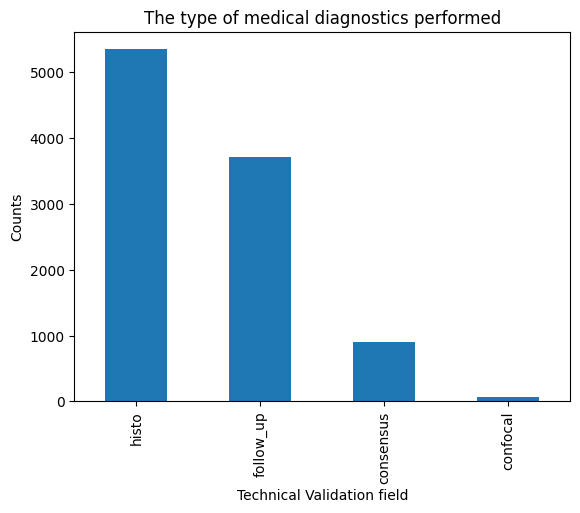

In [9]:
df_skin_cancer['dx_type'].value_counts().plot(kind='bar')
plt.xlabel('Technical Validation field')
plt.ylabel('Counts')
plt.title('The type of medical diagnostics performed')

/tmp/ipykernel_1468606/2857234348.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(df_skin_cancer, x='age', y='sex', inner='box', palette='Dark2')


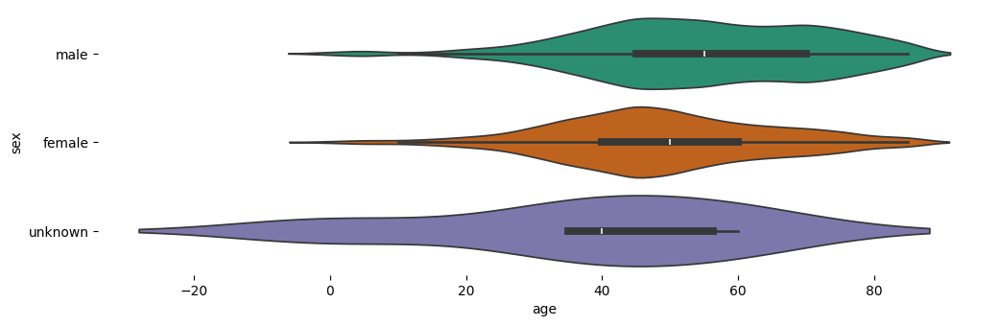

In [10]:
# @title sex vs age

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(df_skin_cancer['sex'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(df_skin_cancer, x='age', y='sex', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

Text(0.5, 1.0, 'The body parts most susceptible for skin cancer')

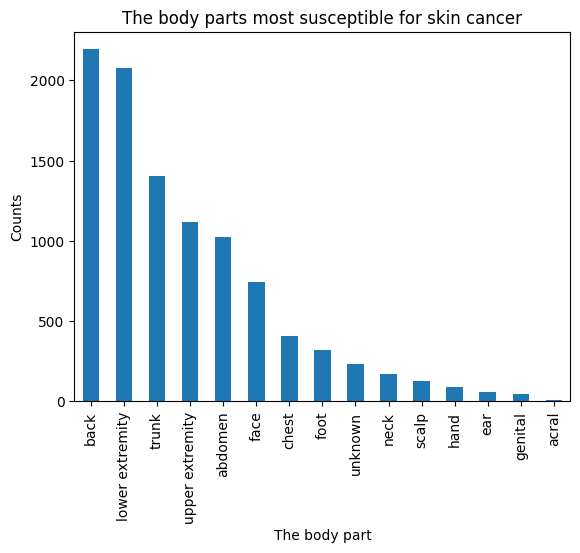

In [11]:
df_skin_cancer['localization'].value_counts().plot(kind='bar')
plt.xlabel('The body part')
plt.ylabel('Counts')
plt.title('The body parts most susceptible for skin cancer')

<h1>Preparando os dados</h1>

In [12]:
# Define a function to load and resize images using TensorFlow
def load_and_resize_image(path, target_size=(100, 75)):
    # Load the image as a TensorFlow tensor
    image = tf.io.read_file(path)
    # Decode the image as a JPEG or PNG (use tf.image.decode_image for either)
    image = tf.image.decode_jpeg(image, channels=3)  # Use decode_png if your images are in PNG format
    # Resize the image
    image = tf.image.resize(image, target_size)
    # Convert the image to a numpy array
    image = np.asarray(image)
    # Normalizing the image
    image = image

    return image

In [13]:
df_skin_cancer['image'] = df_skin_cancer['path'].map(lambda x: load_and_resize_image(x))


2024-12-12 01:29:39.955798: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9545 MB memory:  -> device: 0, name: NVIDIA TITAN V, pci bus id: 0000:06:00.0, compute capability: 7.0


removendo imagens de locais menos comuns

In [14]:
locations_to_remove = ['chest','foot','unknown',"neck","scalp","hand","ear","genital","acral"]
for location in locations_to_remove:
  df_skin_cancer = df_skin_cancer[df_skin_cancer['localization'] != location]

Actinic keratoses
Basal cell carcinoma
Benign keratosis-like lesions
Dermatofibroma
Melanocytic nevi


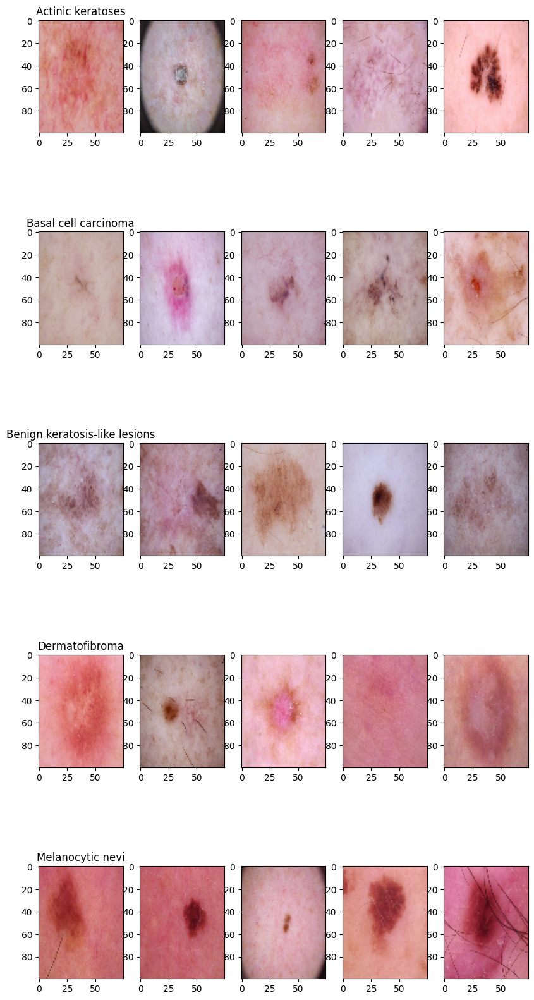

In [15]:
n_samples = 5

fig, m_axs = plt.subplots(5, n_samples, figsize=(2 * n_samples, 3 * 7))

for n_axs, (type_name, type_rows) in zip(m_axs, df_skin_cancer.sort_values(['cell_type']).groupby('cell_type')):
  print(type_name)
  n_axs[0].set_title(type_name)
  rows = type_rows.sample(n_samples, random_state=42)
  #print(rows)
  for row, ax in zip(rows.iterrows(), n_axs):
    image_array = row[1]['image']
    ax.imshow(image_array.astype('uint8'))  # Display the image)

Juntando as classes menores em "outros"

In [16]:
classes_to_unify = ["Vascular lesions", "Dermatofibroma", "Actinic keratoses"]
for class_to_unify in classes_to_unify:
  df_skin_cancer.loc[df_skin_cancer['cell_type'] == class_to_unify, 'cell_type'] = "other"

df_skin_cancer['cell_type'].value_counts()

cell_type
Melanocytic nevi                 5762
Melanoma                          946
Benign keratosis-like lesions     914
other                             513
Basal cell carcinoma              423
Name: count, dtype: int64

Downsample da classe majoritaria

In [17]:
df_balanced = pd.DataFrame()
def downsample_df(df, n_samples,collum_name,collum_value):
    df_unbalanced_class = df[df[collum_name] == collum_value]
    df_others = df[df[collum_name] != collum_value]
    df_balanced_class = resample(df_unbalanced_class,
                                replace=True,    # sample without replacement
                                n_samples=n_samples,  # to match minority class
                                random_state=42) # reproducible results
    df_balanced = pd.concat([df_balanced_class, df_others])
    return df_balanced
df_skin_cancer = downsample_df(df_skin_cancer, 3000, 'cell_type', 'Melanocytic nevi')
print(df_skin_cancer['cell_type'].value_counts())


cell_type
Melanocytic nevi                 3000
Melanoma                          946
Benign keratosis-like lesions     914
other                             513
Basal cell carcinoma              423
Name: count, dtype: int64


In [18]:
df_skin_cancer['cell_type_idx'] = pd.Categorical(df_skin_cancer['cell_type']).codes

In [19]:
train_data, test_data = train_test_split(df_skin_cancer, test_size=0.2, random_state=42)

In [20]:
print(train_data['cell_type'].value_counts())
print(test_data['cell_type'].value_counts())

cell_type
Melanocytic nevi                 2387
Melanoma                          760
Benign keratosis-like lesions     720
other                             417
Basal cell carcinoma              352
Name: count, dtype: int64
cell_type
Melanocytic nevi                 613
Benign keratosis-like lesions    194
Melanoma                         186
other                             96
Basal cell carcinoma              71
Name: count, dtype: int64


In [21]:
train_data['cell_type'].unique()

array(['other', 'Melanocytic nevi', 'Melanoma',
       'Benign keratosis-like lesions', 'Basal cell carcinoma'],
      dtype=object)

In [22]:
from tqdm import tqdm
def balance_dataframe_with_datagen(df, target_column, class_list, target_size, downsample=True):
    """
    Balance a DataFrame by using data augmentation for underrepresented classes 
    and optionally downsampling overrepresented classes.
    
    Parameters:
    -----------
    df : pandas DataFrame
        Input DataFrame containing the dataset
    target_column : str
        Name of the column containing class labels
    class_list : list
        List of class names to balance
    target_size : int
        Desired number of samples for each class
    downsample : bool, optional (default=True)
        Whether to downsample classes that exceed target_size
        
    Returns:
    --------
    pandas DataFrame
        Balanced DataFrame
    """
    
    # Input validation
    if not isinstance(df, pd.DataFrame):
        raise ValueError("Input must be a pandas DataFrame")
    if target_column not in df.columns:
        raise ValueError(f"Column {target_column} not found in DataFrame")
    if not isinstance(class_list, list):
        raise ValueError("class_list must be a list")
    if not all(c in df[target_column].unique() for c in class_list):
        raise ValueError("Some classes in class_list are not present in the DataFrame")
    
    # Create image generator for augmentation
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        zoom_range=0.1,
    )
    
    # Initialize the balanced dataframe
    balanced_df = pd.DataFrame()
    
    print("Initial class distribution:")
    print(df[target_column].value_counts())
    print("\nBalancing classes...")
    
    # Process each class
    for class_name in tqdm(class_list, desc="Processing classes"):
        class_df = df[df[target_column] == class_name].copy()
        current_size = len(class_df)
        
        if current_size == target_size:
            # If class already has target size, add it as is
            balanced_df = pd.concat([balanced_df, class_df], ignore_index=True)
            
        elif current_size > target_size and downsample:
            # Downsample if class is larger than target size
            downsampled = class_df.sample(n=target_size, random_state=42)
            balanced_df = pd.concat([balanced_df, downsampled], ignore_index=True)
            
        else:
            # Need to augment the class
            # First, add all existing samples
            balanced_df = pd.concat([balanced_df, class_df], ignore_index=True)
            
            # Calculate how many more samples needed
            samples_to_generate = target_size - current_size
            
            # Prepare images for augmentation
            images = np.array([img for img in class_df['image']])
            
            # Generate augmented images
            aug_generator = datagen.flow(images, batch_size=1)
            
            # Create new samples with augmented images
            new_rows = []
            for _ in range(samples_to_generate):
                # Get augmented image
                aug_image = next(aug_generator)[0]
                
                # Randomly select a row to copy metadata
                random_idx = np.random.randint(0, len(class_df))
                new_row = class_df.iloc[random_idx].copy()
                new_row['image'] = aug_image
                new_rows.append(new_row)
            
            # Add augmented samples to balanced DataFrame
            augmented_df = pd.DataFrame(new_rows)
            balanced_df = pd.concat([balanced_df, augmented_df], ignore_index=True)
    
    print("\nFinal class distribution:")
    print(balanced_df[target_column].value_counts())
    
    return balanced_df

train_data = balance_dataframe_with_datagen(train_data, 'cell_type', train_data['cell_type'].unique().tolist(), 1000, downsample=True)
test_data = balance_dataframe_with_datagen(test_data, 'cell_type', test_data['cell_type'].unique().tolist(), 300, downsample=True)

Initial class distribution:
cell_type
Melanocytic nevi                 2387
Melanoma                          760
Benign keratosis-like lesions     720
other                             417
Basal cell carcinoma              352
Name: count, dtype: int64

Balancing classes...


Processing classes: 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]



Final class distribution:
cell_type
other                            1000
Melanocytic nevi                 1000
Melanoma                         1000
Benign keratosis-like lesions    1000
Basal cell carcinoma             1000
Name: count, dtype: int64
Initial class distribution:
cell_type
Melanocytic nevi                 613
Benign keratosis-like lesions    194
Melanoma                         186
other                             96
Basal cell carcinoma              71
Name: count, dtype: int64

Balancing classes...


Processing classes: 100%|██████████| 5/5 [00:01<00:00,  3.63it/s]


Final class distribution:
cell_type
Melanoma                         300
Melanocytic nevi                 300
Basal cell carcinoma             300
Benign keratosis-like lesions    300
other                            300
Name: count, dtype: int64


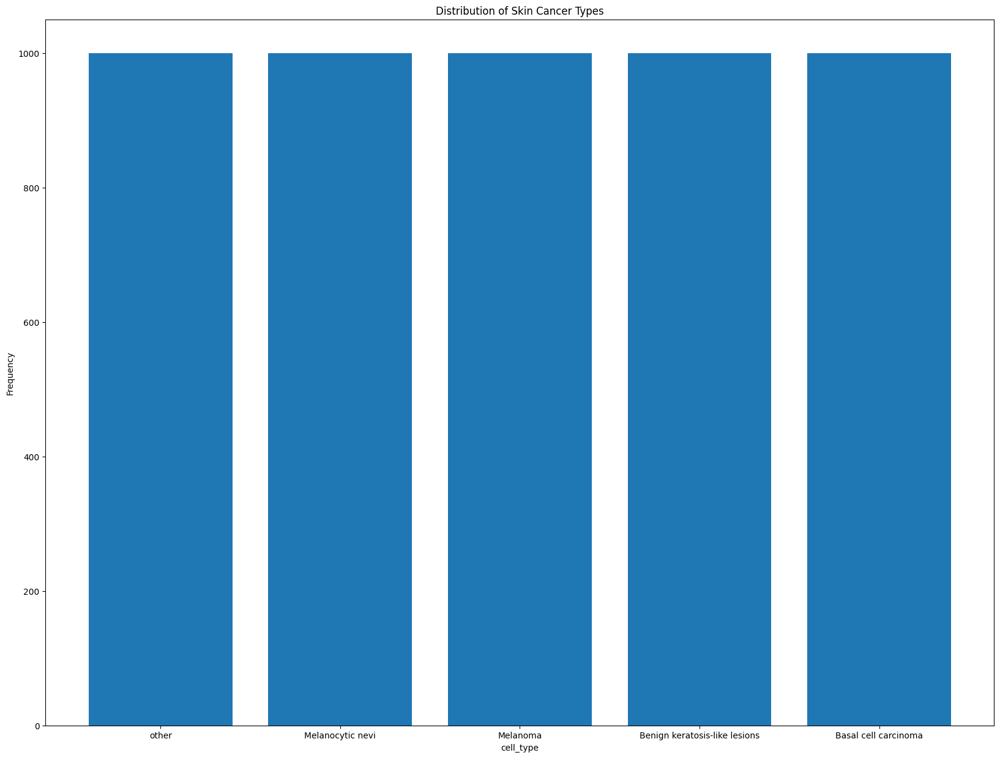

In [23]:
dx_counts = train_data['cell_type'].value_counts()

plt.figure(figsize=(20, 15))
plt.bar(dx_counts.index, dx_counts.values)
plt.title('Distribution of Skin Cancer Types')
plt.xlabel('cell_type')
_ = plt.ylabel('Frequency')

In [24]:
x_train = train_data.drop(columns=['cell_type_idx'],axis=1)
y_train = train_data['cell_type_idx']

x_test = test_data.drop(columns=['cell_type_idx'], axis=1)
y_test = test_data['cell_type_idx'] 

x_train = np.asarray(x_train['image'].tolist())
x_test = np.asarray(x_test['image'].tolist())

#normalização
#x_train_mean = np.mean(x_train)
#x_train_std = np.std(x_train)
#x_train = (x_train - x_train_mean) / x_train_std
#x_test = (x_test - x_train_mean) / x_train_std

y_train = tf.keras.utils.to_categorical(y_train, num_classes=5)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=5)




In [25]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.10, random_state=42)


In [26]:
print(x_train.shape)
print(x_test.shape)

(4500, 100, 75, 3)
(1500, 100, 75, 3)


<h1>Definição do modelo inicial

In [27]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Conv2D,  MaxPool2D, Flatten, GlobalAveragePooling2D,  BatchNormalization, Layer, Add
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model

In [28]:
from tensorflow.keras.utils import register_keras_serializable

@register_keras_serializable()
class CustomResNet(Model):
    def __init__(self, num_classes, trained = False, **kwargs):
        super(CustomResNet, self).__init__(**kwargs)
        self.num_classes = num_classes
        self.input_shape = (100, 75, 3)

        
        if trained:
            self.resnet = tf.keras.applications.ResNet50(
                include_top=False, #sem classificado
                weights='imagenet',
                input_shape=(100, 75, 3),
            )
            self.resnet.trainable = False
        else:
          self.resnet = tf.keras.applications.ResNet50(
              include_top=False, #sem classificado
              weights=None,
              input_shape=(100, 75, 3),
          )
          self.resnet.trainable = True

        #self.input = tf.keras.Input(shape=(100,75,3))
        self.flatten = Flatten()
        self.drop1 = tf.keras.layers.Dropout(0.5)
        self.bn1 = BatchNormalization()
        self.dense1 = Dense(256, activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.01), name = "dense1")
        #self.drop2 = tf.keras.layers.Dropout(0.4)
        #self.bn2 = BatchNormalization()
        #self.dense2 = Dense(256, activation='relu', kernel_regularizer = tf.keras.regularizers.l2(0.01), name = "dense2")
        self.dense_out = Dense(self.num_classes, activation='softmax', name = "dense_out")


    def call(self, inputs, training=None):
        #x = self.input(inputs)
        x = self.resnet(inputs)
        #print(f"Shape after ResNet: {x.shape}")
        x = self.flatten(x)
        #print(f"Shape after Flatten: {x.shape}")
        x = self.drop1(x)
        x = self.bn1(x)
        x = self.dense1(x)
        #print(f"Shape after dense1: {x.shape}")
        #x = self.drop2(x)
        #x = self.bn2(x)
        #x = self.dense2(x)
        #print(f"Shape after dense 2: {x.shape}")
        x = self.dense_out(x)
        #print(f"Shape after dense_out: {x.shape}")
        return x
        
    def get_config(self):
        # Include `num_classes` in the config
        config = super(CustomResNet, self).get_config()  # Include base class config
        config['num_classes'] = self.num_classes
        return config

    @classmethod
    def from_config(cls, config):
        # Evita passar o mesmo argumento mais de uma vez
        return cls(**config)
        
    def build(self, input_shape):
        self.resnet.build(input_shape)
        super(CustomResNet, self).build(input_shape)
        self.built = True



In [29]:
earlyStop = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                         patience=15,
                                         restore_best_weights=True,
                                         start_from_epoch = num_epochs/2,
                                         mode = "min")
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.5,
                              patience=5,
                              min_lr=1e-7,
                              mode = "min")
checkpoint_filepath = './checkpoint/'

callbacks = [earlyStop, reduce_lr]

In [30]:
default_metrics = ["CategoricalAccuracy","f1_score","recall"]

In [31]:
# Create image generator for augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    zoom_range=0.1,
)
datagen.fit(x_train)

In [32]:
resNetModel_cancer = CustomResNet(num_classes=len(df_skin_cancer['cell_type'].unique()))
resNetModel_cancer.build(input_shape=(None, 100, 75, 3))
# Criar um input fictício com o shape esperado
input_shape = (1, 100, 75, 3)  # (batch_size, height, width, channels)
dummy_input = tf.zeros(input_shape)

# Chamar o modelo com o input fictício para inicializar as camadas
_ = resNetModel_cancer(dummy_input)
resNetModel_cancer.summary()

2024-12-12 01:30:54.607750: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8902
W0000 00:00:1733967054.687759 1468606 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1733967054.736356 1468606 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1733967054.736714 1468606 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1733967054.737088 1468606 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1733967054.737403 1468606 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1733967054.737767 1468606 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1733967054.739036 1468606 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1733967054.739402 1468606 gpu_t

Model: "custom_res_net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ ?                      │        98,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ ?                      │     6,291,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_out (Dense)               │ ?                      │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,979,013 (114.36 MB)

 Trainable params: 29,876,741 (113.97 MB)

 Non-trainable params: 102,272 (399.50 KB)

In [33]:
optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001)
resNetModel_cancer.compile(optimizer = optimizer,loss='categorical_crossentropy', metrics=default_metrics)


batch_size = 256
epochs = num_epochs


history = resNetModel_cancer.fit(
    datagen.flow(x_train, y_train, batch_size=batch_size),
    epochs=int(epochs*1.5),
    validation_data=(x_val, y_val),
    verbose=1,
    callbacks=[callbacks,]
)
resNetModel_cancer.save(checkpoint_filepath + "resNetModel_cancer.keras")

Epoch 1/225


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1733967092.291149 1468817 service.cc:146] XLA service 0x7fec04002850 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733967092.291186 1468817 service.cc:154]   StreamExecutor device (0): NVIDIA TITAN V, Compute Capability 7.0
2024-12-12 01:31:33.362986: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1733967121.708533 1468817 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the proce

18/18 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - CategoricalAccuracy: 0.2940 - f1_score: 0.2914 - loss: 8.2934 - recall: 0.2328 - val_CategoricalAccuracy: 0.2100 - val_f1_score: 0.0694 - val_loss: 100.1323 - val_recall: 0.2100 - learning_rate: 0.0010
Epoch 2/225
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 364ms/step - CategoricalAccuracy: 0.3846 - f1_score: 0.3827 - loss: 7.2604 - recall: 0.3340 - val_CategoricalAccuracy: 0.2000 - val_f1_score: 0.0667 - val_loss: 33.2931 - val_recall: 0.2000 - learning_rate: 0.0010
Epoch 3/225
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 347ms/step - CategoricalAccuracy: 0.4070 - f1_score: 0.4070 - loss: 6.4119 - recall: 0.3329 - val_CategoricalAccuracy: 0.2000 - val_f1_score: 0.0667 - val_loss: 9.1815 - val_recall: 0.2000 - learning_rate: 0.0010
Epoch 4/225
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 362ms/step - CategoricalAccuracy: 0.4334 - f1_score: 0.4321 - loss: 5.3156 - recall: 0.3003 - val_CategoricalAccuracy: 0.2000 - val_f1_score: 0.0667 - val_loss: 6.5878 - val_recall: 0.2000 - learning_

In [34]:
print(history.history.keys())

dict_keys(['CategoricalAccuracy', 'f1_score', 'loss', 'recall', 'val_CategoricalAccuracy', 'val_f1_score', 'val_loss', 'val_recall', 'learning_rate'])


In [35]:
def plot_loss_accuracy(history,metrics = ["CategoricalAccuracy","loss"]):
    for metric in metrics:
        plt.plot(history.history['{}'.format(metric)])
        plt.plot(history.history['val_{}'.format(metric)])
        plt.title('Model {}'.format(metric))
        plt.ylabel('{}'.format(metric))
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()
def plot_f1(history, labels, use_labels = True):

    # Get the list of unique class labels
    class_labels = labels

    # Get the F1 scores from the history object
    f1_scores = history.history['f1_score']
    f1_val_scores = history.history['val_f1_score']

    # Assuming f1_score is a list of lists (one list per epoch)
    num_epochs = len(f1_scores)
    epochs = range(1, num_epochs + 1)

    # Plot the F1 scores for each class
    for i, class_label in enumerate(class_labels):
        class_f1_scores = [epoch_scores[i] for epoch_scores in f1_scores]
        class_val_f1_scores = [epoch_scores[i] for epoch_scores in f1_val_scores]
        if use_labels:
          plt.plot(epochs, class_f1_scores, label=class_label)
          plt.plot(epochs, class_val_f1_scores, label=f"val_{class_label}",linestyle='dashed')
        else:
          plt.plot(epochs, class_f1_scores)
          plt.plot(epochs, class_val_f1_scores,linestyle='dashed')

    # Add a legend and title
    if use_labels:
      plt.legend()
    plt.title('F1 Score for Each Class')
    plt.xlabel('Epoch')
    plt.ylabel('F1 Score')

    # Show the plot
    plt.show()

In [36]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, class_names=None):
    """
    Plota a matriz de confusão.

    Args:
        y_true (array-like): Rótulos verdadeiros.
        y_pred (array-like): Rótulos previstos pelo modelo.
        class_names (list, opcional): Lista de nomes das classes. Se None, usa os valores únicos de y_true.
    """
    # Calcular a matriz de confusão
    cm = confusion_matrix(y_true, y_pred)

    # Se as classes não forem fornecidas, usa os valores únicos de y_true como rótulos
    if class_names is None:
        class_names = np.unique(y_true)

    # Plotando a matriz de confusão usando seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names, cbar=False)

    # Adicionando título e rótulos aos eixos
    plt.title("Matriz de Confusão")
    plt.xlabel("Previsões")
    plt.ylabel("Rótulos Verdadeiros")

    # Exibir a matriz de confusão
    plt.show()

In [37]:
y_pred = resNetModel_cancer.predict(x_test)

print(np.argmax(y_pred,axis=-1))
print(np.argmax(y_test,axis=-1))

47/47 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step
[3 3 3 ... 1 1 0]
[3 3 3 ... 4 4 4]


47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


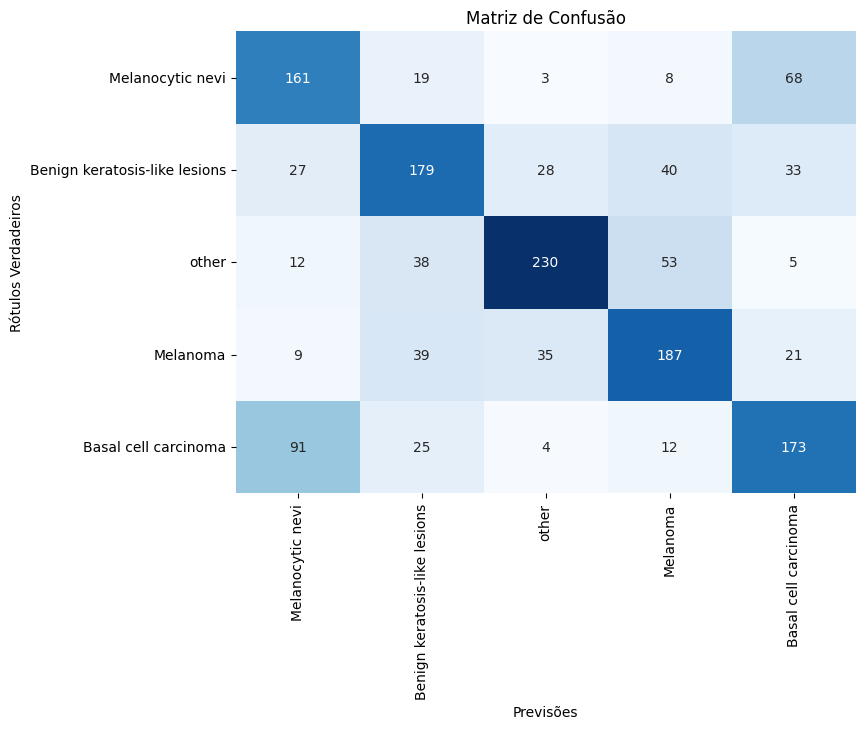

In [38]:
y_pred = resNetModel_cancer.predict(x_test)
plot_confusion_matrix(np.argmax(y_pred,axis=-1),np.argmax(y_test,axis=-1),df_skin_cancer['cell_type'].unique())

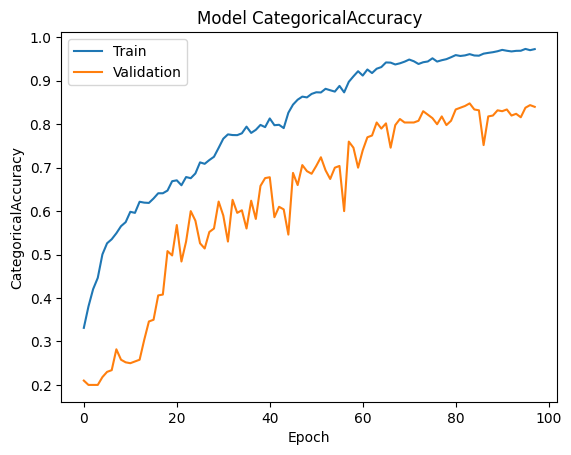

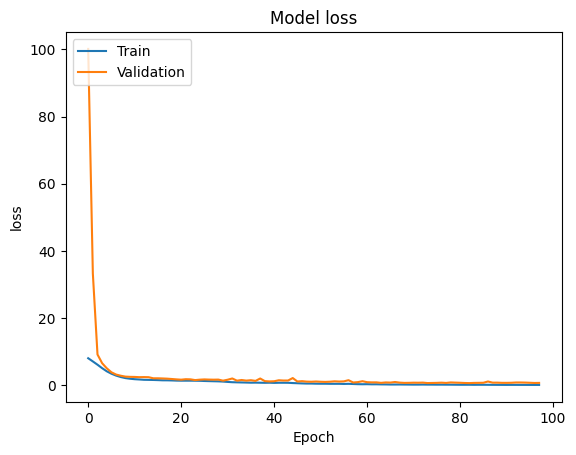

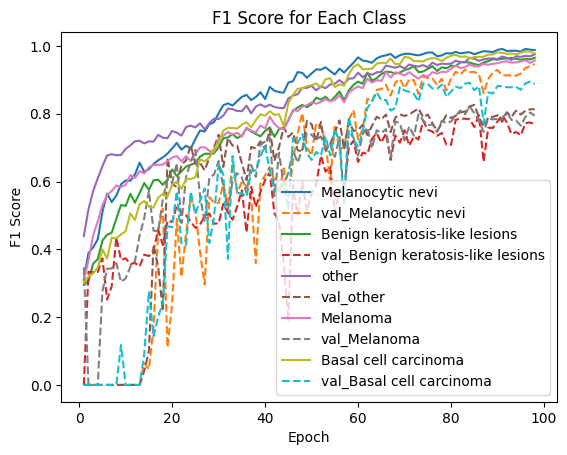

In [39]:
plot_loss_accuracy(history)
plot_f1(history,df_skin_cancer['cell_type'].unique())


In [40]:
loss, acc, f1, recall = resNetModel_cancer.evaluate(x_test, y_test)
print("loss: {}".format(loss))
print("acc: {}".format(acc))
print("f1: {}".format(f1))
print("recall: {}".format(recall))
gc.collect()

47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - CategoricalAccuracy: 0.6419 - f1_score: 0.4069 - loss: 1.5288 - recall: 0.6266
loss: 1.6675806045532227
acc: 0.6200000047683716
f1: [0.57602865 0.5897858  0.7210031  0.6328257  0.5719007 ]
recall: 0.6079999804496765


10904

In [41]:
from sklearn.metrics import accuracy_score, recall_score

def print_metrics_per_class(preds, labels, class_names):
    pred_class_indices = np.argmax(preds, axis=1)
    true_class_indices = np.argmax(labels, axis=1)
    
    class_accuracies = {}
    class_recalls = {}
    
    for i, class_name in enumerate(class_names):
        class_indices = np.where(true_class_indices == i)[0]
        
        if len(class_indices) > 0:  
            class_accuracy = accuracy_score(true_class_indices[class_indices], pred_class_indices[class_indices])
            class_recall = recall_score(true_class_indices[class_indices], pred_class_indices[class_indices], average='macro', zero_division=0)
            class_accuracies[class_name] = class_accuracy
            class_recalls[class_name] = class_recall
        else:
            class_accuracies[class_name] = None  # No samples for this class
            class_recalls[class_name] = None
    
    for class_name in class_names:
        acc = class_accuracies[class_name]
        recall = class_recalls[class_name]
        if acc is not None and recall is not None:
            print(f"{class_name}: Accuracy = {acc * 100:.2f}%, Recall = {recall * 100:.2f}%")
        else:
            print(f"{class_name}: No samples available.")

print_metrics_per_class(y_pred, y_test, df_skin_cancer['cell_type'].unique())


Melanocytic nevi: Accuracy = 53.67%, Recall = 10.73%
Benign keratosis-like lesions: Accuracy = 59.67%, Recall = 11.93%
other: Accuracy = 76.67%, Recall = 15.33%
Melanoma: Accuracy = 62.33%, Recall = 12.47%
Basal cell carcinoma: Accuracy = 57.67%, Recall = 11.53%


In [42]:
del df_skin_cancer

<h1>dataset 2 skin diseases

In [43]:
import kagglehub

# Download latest version
path_skin_disease = kagglehub.dataset_download("haroonalam16/20-skin-diseases-dataset")

print("Path to dataset files:", path_skin_disease)

Path to dataset files: /home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1


In [44]:
import os

In [45]:
!rm -r '/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/test/Atopic Dermatitis Photos/Acne and Rosacea Photos'

rm: cannot remove '/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/test/Atopic Dermatitis Photos/Acne and Rosacea Photos': No such file or directory


In [46]:
data_dir = path_skin_disease + "/Dataset"

data_train = []
target_train = []
data_test = []
target_test = []
labels = []

labels = os.listdir(data_dir + "/train")
for type_data in ["train","test"]:
  for label in labels:
    print(os.path.join(data_dir,type_data,label))
    for file in os.listdir(os.path.join(data_dir,type_data,label)):
      print(os.path.join(data_dir,type_data,label,file))
      image=tf.keras.preprocessing.image.load_img(os.path.join(data_dir,type_data,label,file), color_mode='rgb',
      target_size= (100, 75))
      image=np.array(image)
      if type_data == "train":
        data_train.append(image)
        target_train.append(label)
      else:
        data_test.append(image)
        target_test.append(label)





/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/train/Tinea Ringworm Candidiasis and other Fungal Infections
/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/train/Tinea Ringworm Candidiasis and other Fungal Infections/tinea-face-14.jpg
/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/train/Tinea Ringworm Candidiasis and other Fungal Infections/perleche-20.jpg
/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/train/Tinea Ringworm Candidiasis and other Fungal Infections/tinea-face-58.jpg
/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/train/Tinea Ringworm Candidiasis and other Fungal Infections/tinea-beard-8.jpg
/home/mlima/.cache/kagglehub/datasets/haroonalam16/20-skin-diseases-dataset/versions/1/Dataset/train/Tinea Ringworm Candidiasis and other Fungal Infec

In [47]:
df_skin_disease = pd.DataFrame(columns=['image','target'])
df_skin_disease['image'] = data_train
df_skin_disease['target'] = target_train
df_skin_disease_test = pd.DataFrame(columns=['image','target'])
df_skin_disease_test['image'] = data_test
df_skin_disease_test['target'] = target_test

In [48]:
df_skin_disease.head()

,image,target
0,"[[[22, 14, 12], [26, 17, 18], [30, 20, 19], [3...",Tinea Ringworm Candidiasis and other Fungal In...
1,"[[[164, 128, 112], [161, 130, 112], [183, 150,...",Tinea Ringworm Candidiasis and other Fungal In...
2,"[[[21, 17, 18], [49, 47, 50], [13, 7, 9], [15,...",Tinea Ringworm Candidiasis and other Fungal In...
3,"[[[206, 134, 137], [196, 131, 129], [211, 137,...",Tinea Ringworm Candidiasis and other Fungal In...
4,"[[[182, 139, 122], [222, 182, 172], [167, 113,...",Tinea Ringworm Candidiasis and other Fungal In...


Text(0.5, 1.0, 'distribution')

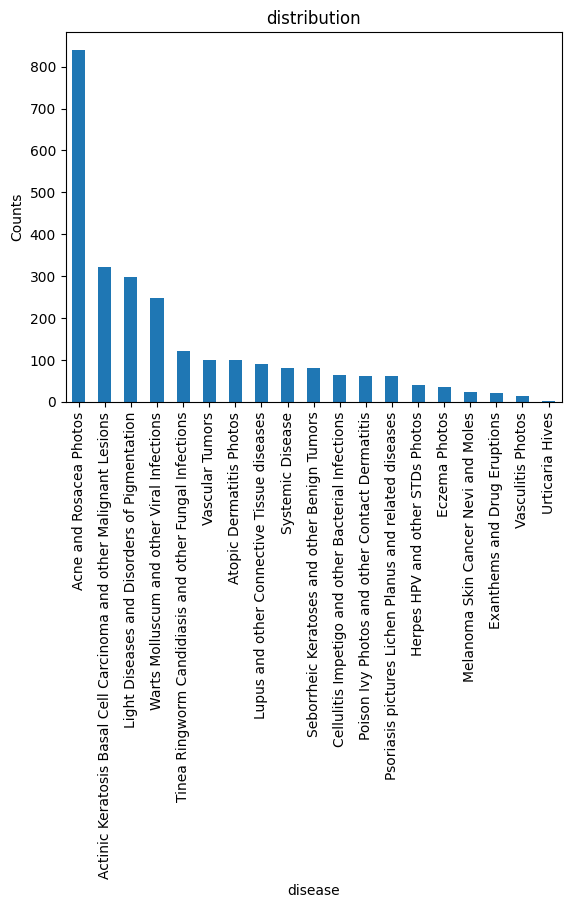

In [49]:
df_skin_disease['target'].value_counts().plot(kind='bar')
plt.xlabel('disease')
plt.ylabel('Counts')
plt.title('distribution')

In [50]:
classes_to_unify = ["Urticaria Hives",
                    "Vasculitis Photos",
                    "Exanthems and Drug Eruptions",
                    "Melanoma Skin Cancer Nevi and Moles",
                    "Eczema Photos",
                    "Herpes HPV and other STDs Photos"]
for class_to_unify in classes_to_unify:
  df_skin_disease.loc[df_skin_disease['target'] == class_to_unify, 'target'] = "other"
  df_skin_disease_test.loc[df_skin_disease_test['target'] == class_to_unify, 'target'] = "other"

print(df_skin_disease['target'].value_counts())
print(df_skin_disease_test['target'].value_counts())


target
Acne and Rosacea Photos                                               840
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions    322
Light Diseases and Disorders of Pigmentation                          299
Warts Molluscum and other Viral Infections                            248
other                                                                 137
Tinea Ringworm Candidiasis and other Fungal Infections                122
Vascular Tumors                                                       101
Atopic Dermatitis Photos                                              100
Lupus and other Connective Tissue diseases                             90
Systemic Disease                                                       81
Seborrheic Keratoses and other Benign Tumors                           80
Cellulitis Impetigo and other Bacterial Infections                     65
Poison Ivy Photos and other Contact Dermatitis                         62
Psoriasis pictures Lichen Planu

In [51]:
data_train_raw = balance_dataframe_with_datagen(df_skin_disease, 'target', df_skin_disease['target'].unique().tolist(), 350, downsample=True)
data_test_raw = balance_dataframe_with_datagen(df_skin_disease_test, 'target', df_skin_disease['target'].unique().tolist(), 75, downsample=True)

Initial class distribution:
target
Acne and Rosacea Photos                                               840
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions    322
Light Diseases and Disorders of Pigmentation                          299
Warts Molluscum and other Viral Infections                            248
other                                                                 137
Tinea Ringworm Candidiasis and other Fungal Infections                122
Vascular Tumors                                                       101
Atopic Dermatitis Photos                                              100
Lupus and other Connective Tissue diseases                             90
Systemic Disease                                                       81
Seborrheic Keratoses and other Benign Tumors                           80
Cellulitis Impetigo and other Bacterial Infections                     65
Poison Ivy Photos and other Contact Dermatitis                         62
Pso

Processing classes: 100%|██████████| 14/14 [00:05<00:00,  2.44it/s]



Final class distribution:
target
Tinea Ringworm Candidiasis and other Fungal Infections                350
other                                                                 350
Poison Ivy Photos and other Contact Dermatitis                        350
Vascular Tumors                                                       350
Warts Molluscum and other Viral Infections                            350
Acne and Rosacea Photos                                               350
Cellulitis Impetigo and other Bacterial Infections                    350
Atopic Dermatitis Photos                                              350
Lupus and other Connective Tissue diseases                            350
Light Diseases and Disorders of Pigmentation                          350
Psoriasis pictures Lichen Planus and related diseases                 350
Seborrheic Keratoses and other Benign Tumors                          350
Systemic Disease                                                      350
Acti

Processing classes: 100%|██████████| 14/14 [00:01<00:00, 12.10it/s]


Final class distribution:
target
Tinea Ringworm Candidiasis and other Fungal Infections                75
other                                                                 75
Poison Ivy Photos and other Contact Dermatitis                        75
Vascular Tumors                                                       75
Warts Molluscum and other Viral Infections                            75
Acne and Rosacea Photos                                               75
Cellulitis Impetigo and other Bacterial Infections                    75
Atopic Dermatitis Photos                                              75
Lupus and other Connective Tissue diseases                            75
Light Diseases and Disorders of Pigmentation                          75
Psoriasis pictures Lichen Planus and related diseases                 75
Seborrheic Keratoses and other Benign Tumors                          75
Systemic Disease                                                      75
Actinic Keratosis

Text(0.5, 1.0, 'distribution')

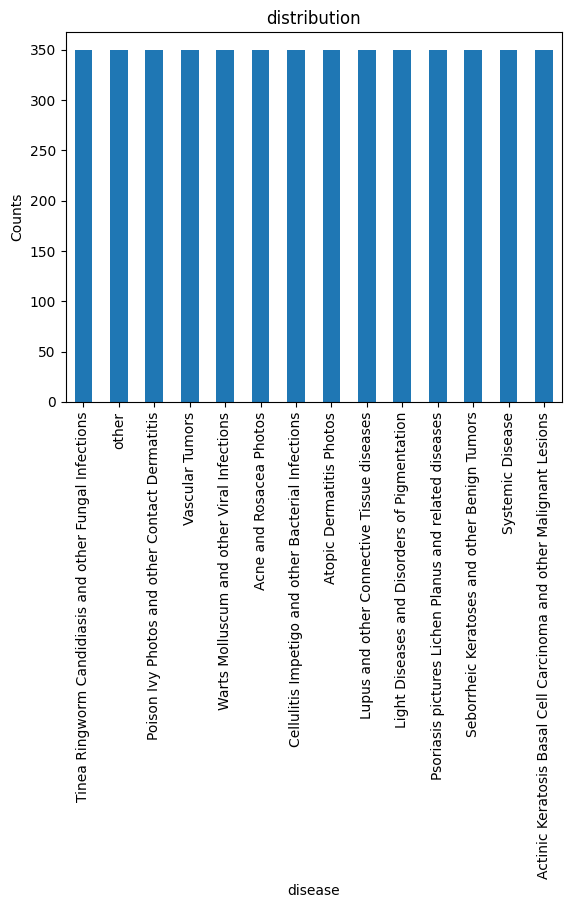

In [52]:
data_train_raw['target'].value_counts().plot(kind='bar')
plt.xlabel('disease')
plt.ylabel('Counts')
plt.title('distribution')

Acne and Rosacea Photos
Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions
Atopic Dermatitis Photos
Cellulitis Impetigo and other Bacterial Infections
Light Diseases and Disorders of Pigmentation
Lupus and other Connective Tissue diseases
Poison Ivy Photos and other Contact Dermatitis
Psoriasis pictures Lichen Planus and related diseases
Seborrheic Keratoses and other Benign Tumors
Systemic Disease
Tinea Ringworm Candidiasis and other Fungal Infections
Vascular Tumors
Warts Molluscum and other Viral Infections
other


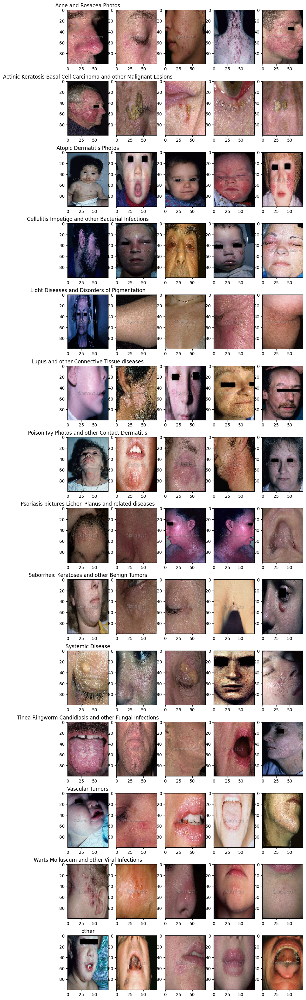

In [53]:
n_samples = 5

fig, m_axs = plt.subplots((len(df_skin_disease['target'].unique())), n_samples, figsize=(2 * n_samples, 3 * (len(df_skin_disease['target'].unique()))))

for n_axs, (type_name, type_rows) in zip(m_axs, df_skin_disease.sort_values(['target']).groupby('target')):
  print(type_name)
  n_axs[0].set_title(type_name)
  num_samples = min(n_samples, len(type_rows))

  rows = type_rows.sample(num_samples, random_state=42)
  #print(rows)
  for row, ax in zip(rows.iterrows(), n_axs):
    image_array = row[1]['image']
    ax.imshow(image_array.astype('uint8'))  # Display the image)

In [54]:
data_train = np.asarray(data_train_raw['image'].tolist())
data_test = np.asarray(data_test_raw['image'].tolist())
target_train = np.asarray(data_train_raw['target'].tolist())
target_test = np.asarray(data_test_raw['target'].tolist())

print("numero de imgs de treino {}".format(len(data_train)))
print("numero de imgs de test {}".format(len(data_test)))

numero de imgs de treino 4900
numero de imgs de test 1050


In [55]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
label_encoder.fit(target_train)  # Ajuste

target_train_encoded = label_encoder.transform(target_train)
target_test_encoded = label_encoder.transform(target_test)

target_train_categorical = tf.keras.utils.to_categorical(target_train_encoded, num_classes=14)
target_test_categorical = tf.keras.utils.to_categorical(target_test_encoded, num_classes=14)


In [56]:
x_train, x_val, y_train, y_val = train_test_split(data_train, target_train_categorical, test_size=0.20, random_state=42)
x_test = data_test
y_test = target_test_categorical

In [57]:
datagen.fit(x_train)

<h1>Treinando um resnet50 do zero</h1>

In [58]:
resnet50_no_train = CustomResNet(num_classes=14)
input_shape = (1, 100, 75, 3)  # (batch_size, height, width, channels)
resnet50_no_train.build(input_shape=(None, 100, 75, 3))
dummy_input = tf.zeros(input_shape)

# Chamar o modelo com o input fictício para inicializar as camadas
_ = resnet50_no_train(dummy_input)
resnet50_no_train.summary()

Model: "custom_res_net_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ ?                      │        98,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ ?                      │     6,291,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_out (Dense)               │ ?                      │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,981,326 (114.37 MB)

 Trainable params: 29,879,054 (113.98 MB)

 Non-trainable params: 102,272 (399.50 KB)

In [59]:
x_train = np.array(x_train)
x_val = np.array(x_val)
x_test = np.array(x_test)

In [60]:
optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001)
resnet50_no_train.compile(optimizer = optimizer,loss='categorical_crossentropy', metrics=default_metrics)

batch_size = 256
epochs = num_epochs


history = resnet50_no_train.fit(
    datagen.flow(x_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(x_val, y_val),
    verbose=1,
    callbacks=[callbacks]
)
resnet50_no_train.save(checkpoint_filepath + "resnet50_no_train.keras")

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 9/16 ━━━━━━━━━━━━━━━━━━━━ 3s 439ms/step - CategoricalAccuracy: 0.0770 - f1_score: 0.0691 - loss: 9.4961 - recall: 0.0198

2024-12-12 01:50:38.914362: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.63GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-12-12 01:50:38.914417: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.63GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-12-12 01:50:38.914443: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.63GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-12-12 01:50:39.168144: W external/local_tsl/tsl/framework/bfc_

16/16 ━━━━━━━━━━━━━━━━━━━━ 90s 2s/step - CategoricalAccuracy: 0.0804 - f1_score: 0.0760 - loss: 9.4202 - recall: 0.0211 - val_CategoricalAccuracy: 0.0786 - val_f1_score: 0.0165 - val_loss: 97.2955 - val_recall: 0.0786 - learning_rate: 0.0010
Epoch 2/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 354ms/step - CategoricalAccuracy: 0.0852 - f1_score: 0.0828 - loss: 8.9323 - recall: 0.0215 - val_CategoricalAccuracy: 0.0633 - val_f1_score: 0.0085 - val_loss: 17.0543 - val_recall: 0.0633 - learning_rate: 0.0010
Epoch 3/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 373ms/step - CategoricalAccuracy: 0.1141 - f1_score: 0.1126 - loss: 8.3860 - recall: 0.0176 - val_CategoricalAccuracy: 0.0633 - val_f1_score: 0.0085 - val_loss: 18.0312 - val_recall: 0.0633 - learning_rate: 0.0010
Epoch 4/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 336ms/step - CategoricalAccuracy: 0.1136 - f1_score: 0.1126 - loss: 7.7941 - recall: 0.0095 - val_CategoricalAccuracy: 0.0633 - val_f1_score: 0.0085 - val_loss: 11.0116 - val_recall: 0.0633 - learning_rat

33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step


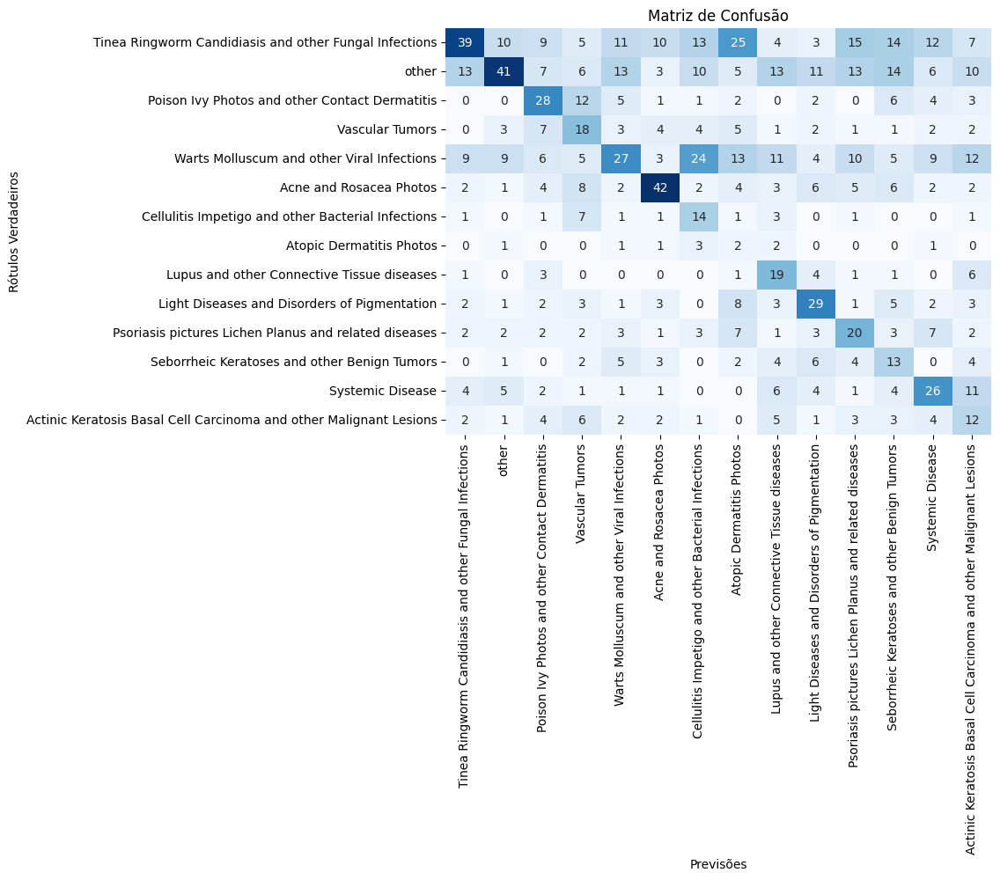

In [61]:
y_pred = resnet50_no_train.predict(x_test)
plot_confusion_matrix(np.argmax(y_pred,axis=-1),np.argmax(y_test,axis=-1),df_skin_disease['target'].unique())

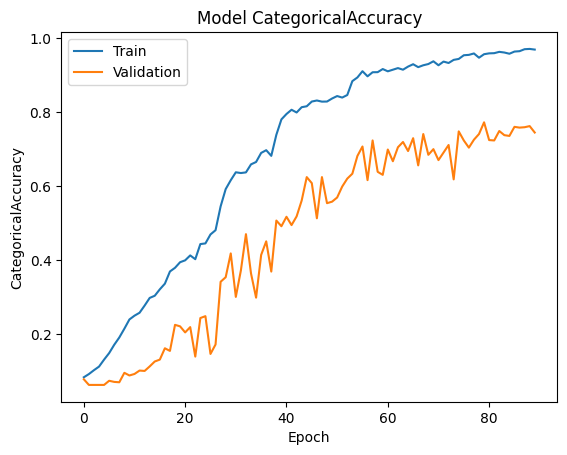

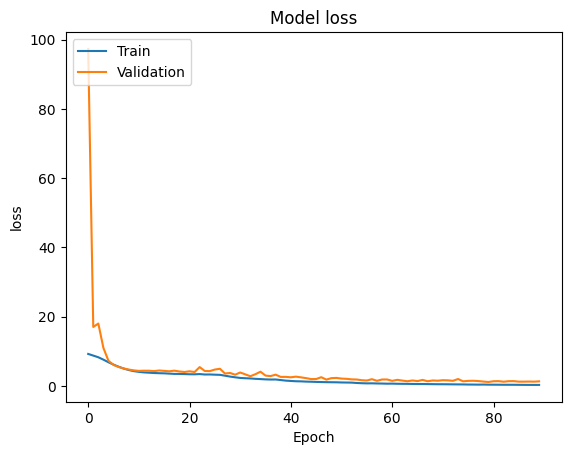

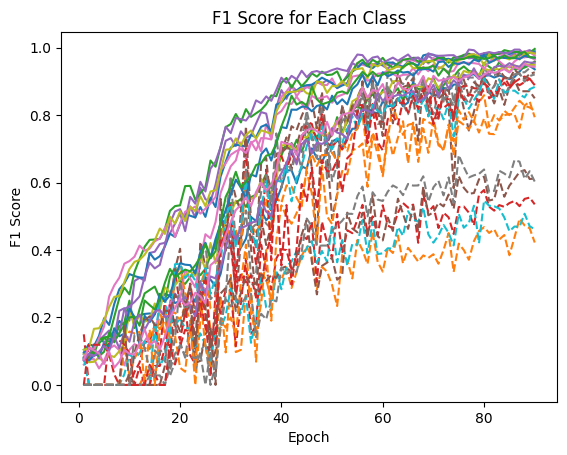

In [62]:
plot_loss_accuracy(history)
plot_f1(history,df_skin_disease['target'].unique(),False)

In [63]:
loss, acc, f1, recall = resnet50_no_train.evaluate(x_test, y_test)
print("loss: {}".format(loss))
print("acc: {}".format(acc))
print("f1: {}".format(f1))
print("recall: {}".format(recall))
gc.collect()

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - CategoricalAccuracy: 0.2686 - f1_score: 0.1768 - loss: 4.7018 - recall: 0.2494
loss: 4.420251369476318
acc: 0.3142857253551483
f1: [0.30952373 0.3416666  0.40287763 0.28124994 0.24324317 0.51219505
 0.26415092 0.0465116  0.3423423  0.42028975 0.3007518  0.21848735
 0.36879426 0.19834706]
recall: 0.2904762029647827


39397

In [64]:
y_pred = resnet50_no_train.predict(x_test)
print_metrics_per_class(y_pred,y_test,data_train_raw['target'].unique())

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Tinea Ringworm Candidiasis and other Fungal Infections: Accuracy = 52.00%, Recall = 5.20%
other: Accuracy = 54.67%, Recall = 4.97%
Poison Ivy Photos and other Contact Dermatitis: Accuracy = 37.33%, Recall = 3.11%
Vascular Tumors: Accuracy = 24.00%, Recall = 2.00%
Warts Molluscum and other Viral Infections: Accuracy = 36.00%, Recall = 2.77%
Acne and Rosacea Photos: Accuracy = 56.00%, Recall = 4.31%
Cellulitis Impetigo and other Bacterial Infections: Accuracy = 18.67%, Recall = 1.87%
Atopic Dermatitis Photos: Accuracy = 2.67%, Recall = 0.22%
Lupus and other Connective Tissue diseases: Accuracy = 25.33%, Recall = 1.95%
Light Diseases and Disorders of Pigmentation: Accuracy = 38.67%, Recall = 3.22%
Psoriasis pictures Lichen Planus and related diseases: Accuracy = 26.67%, Recall = 2.22%
Seborrheic Keratoses and other Benign Tumors: Accuracy = 17.33%, Recall = 1.44%
Systemic Disease: Accuracy = 34.67%, Recall = 3.15%
Actinic Keratosis Basal Cell Carcino

<h1>fine-tuning retreinando uma rede já treinada em dominio proximo</h1>

In [65]:
resnet50_cancer_ft = CustomResNet(num_classes=14)

dummy_input = tf.zeros(input_shape)

# Chamar o modelo com o input fictício para inicializar as camadas
_ = resnet50_cancer_ft(dummy_input)
resnet50_cancer_ft.build(input_shape=(None, 100, 75, 3))

resnet50_cancer_ft.resnet.set_weights(resNetModel_cancer.resnet.get_weights())
resnet50_cancer_ft.dense1.set_weights(resNetModel_cancer.dense1.get_weights())
#resnet50_cancer_ft.dense2.set_weights(resNetModel_cancer.dense2.get_weights())
resnet50_cancer_ft.summary()

Model: "custom_res_net_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ ?                      │        98,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ ?                      │     6,291,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_out (Dense)               │ ?                      │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,981,326 (114.37 MB)

 Trainable params: 29,879,054 (113.98 MB)

 Non-trainable params: 102,272 (399.50 KB)

In [66]:

optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001)
resnet50_cancer_ft.compile(optimizer = optimizer,loss='categorical_crossentropy', metrics=default_metrics)

batch_size = 256
epochs = num_epochs


history = resnet50_cancer_ft.fit(
    datagen.flow(x_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(x_val, y_val),
    verbose=1,
    callbacks=[callbacks,]
)
resnet50_cancer_ft.save(checkpoint_filepath + "resnet50_cancer_ft.keras")

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - CategoricalAccuracy: 0.0991 - f1_score: 0.0892 - loss: 3.2486 - recall: 0.0071 - val_CategoricalAccuracy: 0.0653 - val_f1_score: 0.0088 - val_loss: 522.5873 - val_recall: 0.0653 - learning_rate: 0.0010
Epoch 2/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 365ms/step - CategoricalAccuracy: 0.1293 - f1_score: 0.1261 - loss: 3.9591 - recall: 0.0144 - val_CategoricalAccuracy: 0.0653 - val_f1_score: 0.0088 - val_loss: 183.6581 - val_recall: 0.0653 - learning_rate: 0.0010
Epoch 3/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 475ms/step - CategoricalAccuracy: 0.1603 - f1_score: 0.1513 - loss: 4.2582 - recall: 0.0195 - val_CategoricalAccuracy: 0.0653 - val_f1_score: 0.0088 - val_loss: 43.9369 - val_recall: 0.0653 - learning_rate: 0.0010
Epoch 4/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 12s 465ms/step - CategoricalAccuracy: 0.1925 - f1_score: 0.1785 - loss: 4.2746 - recall: 0.0217 - val_CategoricalAccuracy: 0.0653 - val_f1_score: 0.0088 - val_loss: 27.2224 - val_recall: 0.0653 - learning

33/33 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step


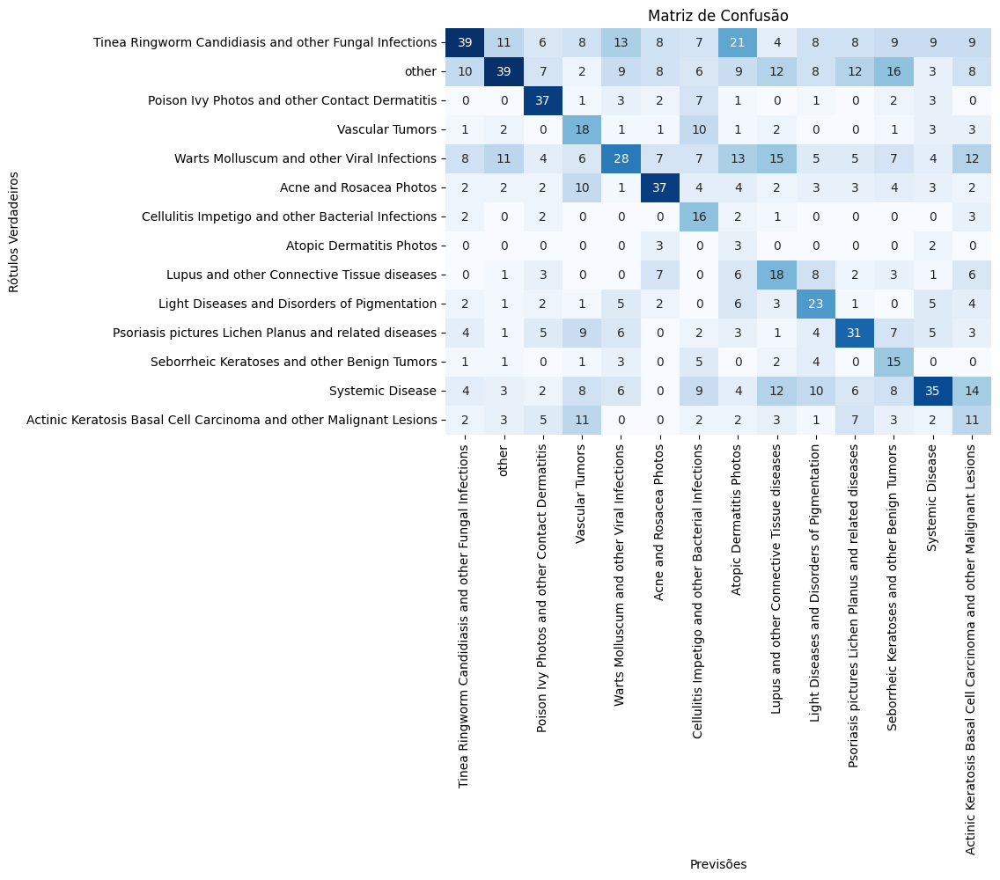

In [67]:
y_pred = resnet50_cancer_ft.predict(x_test)
plot_confusion_matrix(np.argmax(y_pred,axis=-1),np.argmax(y_test,axis=-1),df_skin_disease['target'].unique())

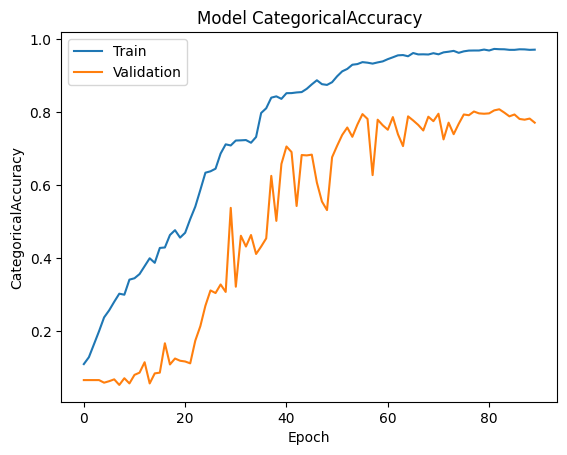

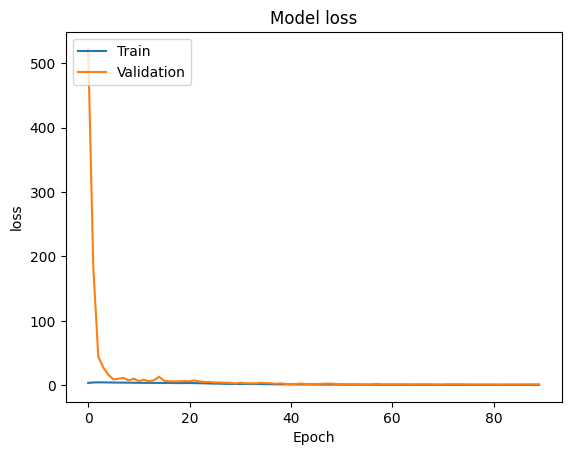

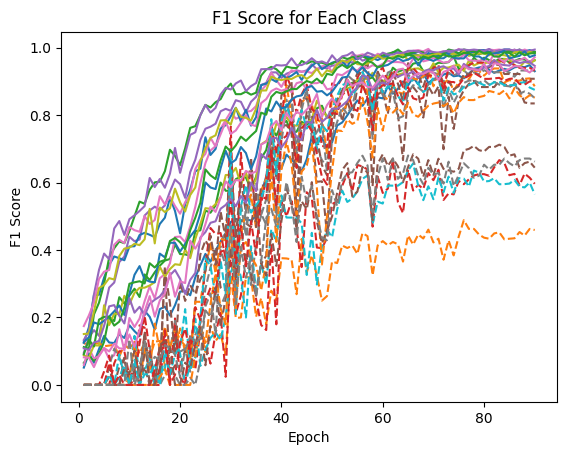

In [68]:
plot_loss_accuracy(history)
plot_f1(history,df_skin_disease['target'].unique(),False)

In [69]:
loss, acc, f1, recall = resnet50_cancer_ft.evaluate(x_test, y_test)
print("loss: {}".format(loss))
print("acc: {}".format(acc))
print("f1: {}".format(f1))
print("recall: {}".format(recall))
gc.collect()

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - CategoricalAccuracy: 0.3188 - f1_score: 0.1961 - loss: 4.4336 - recall: 0.2952
loss: 4.371744632720947
acc: 0.3333333432674408
f1: [0.33191484 0.34821424 0.560606   0.30508468 0.27053136 0.4805194
 0.31683165 0.07228914 0.276923   0.35384607 0.39743584 0.28037378
 0.3571428  0.1732283 ]
recall: 0.31142857670783997


26796

In [70]:
y_pred = resnet50_cancer_ft.predict(x_test)
print_metrics_per_class(y_pred,y_test,data_train_raw['target'].unique())

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Tinea Ringworm Candidiasis and other Fungal Infections: Accuracy = 52.00%, Recall = 4.73%
other: Accuracy = 52.00%, Recall = 4.73%
Poison Ivy Photos and other Contact Dermatitis: Accuracy = 49.33%, Recall = 4.48%
Vascular Tumors: Accuracy = 24.00%, Recall = 2.18%
Warts Molluscum and other Viral Infections: Accuracy = 37.33%, Recall = 3.73%
Acne and Rosacea Photos: Accuracy = 49.33%, Recall = 5.48%
Cellulitis Impetigo and other Bacterial Infections: Accuracy = 21.33%, Recall = 1.94%
Atopic Dermatitis Photos: Accuracy = 4.00%, Recall = 0.31%
Lupus and other Connective Tissue diseases: Accuracy = 24.00%, Recall = 2.00%
Light Diseases and Disorders of Pigmentation: Accuracy = 30.67%, Recall = 2.79%
Psoriasis pictures Lichen Planus and related diseases: Accuracy = 41.33%, Recall = 4.59%
Seborrheic Keratoses and other Benign Tumors: Accuracy = 20.00%, Recall = 1.82%
Systemic Disease: Accuracy = 46.67%, Recall = 3.89%
Actinic Keratosis Basal Cell Carcino

<h1>Transfer learning retreinando uma rede já treinada em dominio proximo congelando as camadas mais baixas </h1>

In [71]:
resnet50_cancer_tfl = CustomResNet(num_classes=14)

dummy_input = tf.zeros(input_shape)

# Chamar o modelo com o input fictício para inicializar as camadas
_ = resnet50_cancer_tfl(dummy_input)
resnet50_cancer_tfl.build(input_shape=(None, 100, 75, 3))

resnet50_cancer_tfl.resnet.set_weights(resNetModel_cancer.resnet.get_weights())
resnet50_cancer_tfl.dense1.set_weights(resNetModel_cancer.dense1.get_weights())
#resnet50_cancer_tfl.dense2.set_weights(resNetModel_cancer.dense2.get_weights())
resnet50_cancer_tfl.resnet.trainable = False
resnet50_cancer_tfl.summary()

Model: "custom_res_net_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ ?                      │        98,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ ?                      │     6,291,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_out (Dense)               │ ?                      │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,981,326 (114.37 MB)

 Trainable params: 6,344,462 (24.20 MB)

 Non-trainable params: 23,636,864 (90.17 MB)

In [72]:

optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001)
resnet50_cancer_tfl.compile(optimizer = optimizer,loss='categorical_crossentropy', metrics=default_metrics)


batch_size = 256
epochs = num_epochs


history = resnet50_cancer_tfl.fit(
    datagen.flow(x_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(x_val, y_val),
    verbose=1,
    callbacks=[callbacks]
)
resnet50_cancer_tfl.save(checkpoint_filepath + "resnet50_cancer_tfl.keras")

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 27s 850ms/step - CategoricalAccuracy: 0.1062 - f1_score: 0.1031 - loss: 3.7867 - recall: 0.0331 - val_CategoricalAccuracy: 0.0939 - val_f1_score: 0.0410 - val_loss: 9.0496 - val_recall: 0.0908 - learning_rate: 0.0010
Epoch 2/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 284ms/step - CategoricalAccuracy: 0.1966 - f1_score: 0.1935 - loss: 4.2672 - recall: 0.1061 - val_CategoricalAccuracy: 0.1898 - val_f1_score: 0.1500 - val_loss: 6.0928 - val_recall: 0.1398 - learning_rate: 0.0010
Epoch 3/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 282ms/step - CategoricalAccuracy: 0.2139 - f1_score: 0.2121 - loss: 4.6514 - recall: 0.1165 - val_CategoricalAccuracy: 0.1510 - val_f1_score: 0.1120 - val_loss: 6.0201 - val_recall: 0.1194 - learning_rate: 0.0010
Epoch 4/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 285ms/step - CategoricalAccuracy: 0.2457 - f1_score: 0.2441 - loss: 4.7568 - recall: 0.1365 - val_CategoricalAccuracy: 0.1969 - val_f1_score: 0.1584 - val_loss: 5.5146 - val_recall: 0.1224 - learning_rate

33/33 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step


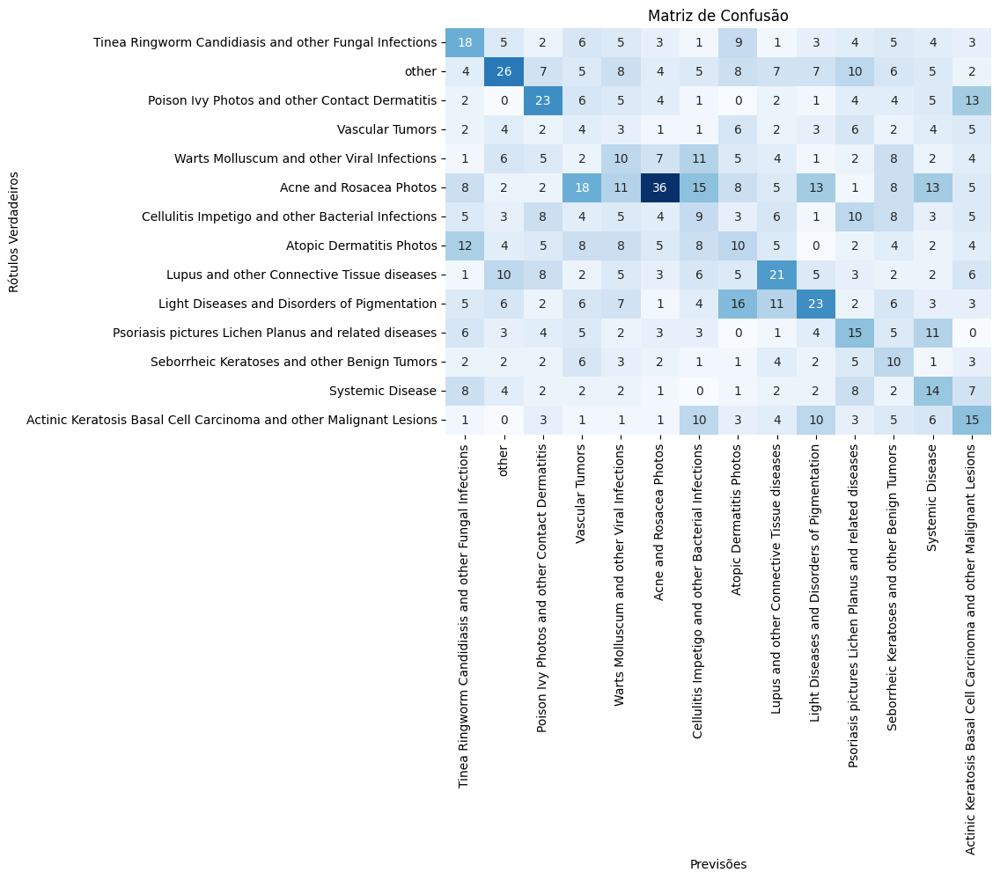

In [73]:
y_pred = resnet50_cancer_tfl.predict(x_test)
plot_confusion_matrix(np.argmax(y_pred,axis=-1),np.argmax(y_test,axis=-1),df_skin_disease['target'].unique())

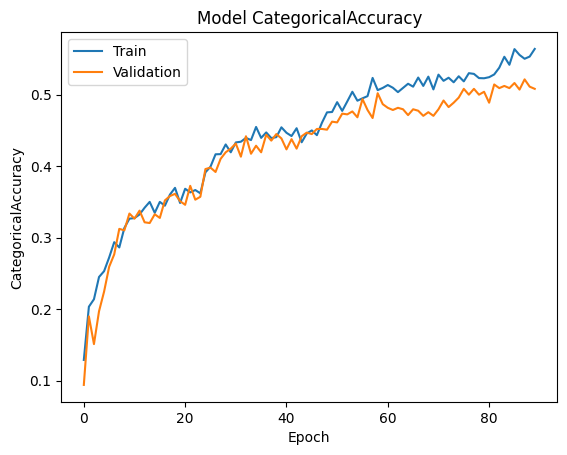

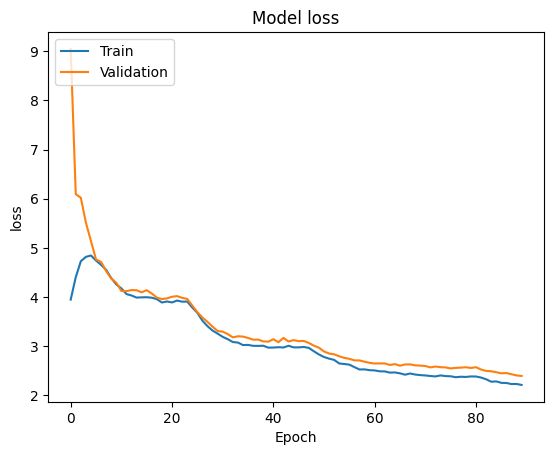

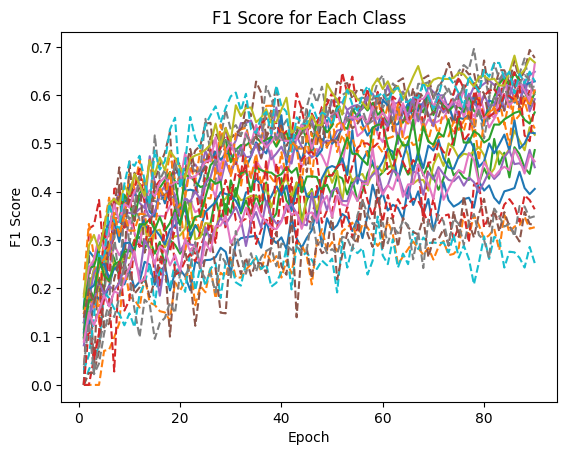

In [74]:
plot_loss_accuracy(history)
plot_f1(history,df_skin_disease['target'].unique(),False)

In [75]:
loss, acc, f1, recall = resnet50_cancer_tfl.evaluate(x_test, y_test)
print("loss: {}".format(loss))
print("acc: {}".format(acc))
print("f1: {}".format(f1))
print("recall: {}".format(recall))
gc.collect()

33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - CategoricalAccuracy: 0.1931 - f1_score: 0.1248 - loss: 3.5913 - recall: 0.0474
loss: 3.519223213195801
acc: 0.22285714745521545
f1: [0.24999994 0.29050273 0.31724134 0.06666662 0.13986011 0.32727268
 0.12080532 0.1315789  0.27272722 0.2705882  0.21897805 0.16806719
 0.21538457 0.21739127]
recall: 0.05904762074351311


26971

In [76]:
y_pred = resnet50_cancer_tfl.predict(x_test)
print_metrics_per_class(y_pred,y_test,data_train_raw['target'].unique())

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Tinea Ringworm Candidiasis and other Fungal Infections: Accuracy = 24.00%, Recall = 1.71%
other: Accuracy = 34.67%, Recall = 2.89%
Poison Ivy Photos and other Contact Dermatitis: Accuracy = 30.67%, Recall = 2.19%
Vascular Tumors: Accuracy = 5.33%, Recall = 0.38%
Warts Molluscum and other Viral Infections: Accuracy = 13.33%, Recall = 0.95%
Acne and Rosacea Photos: Accuracy = 48.00%, Recall = 3.43%
Cellulitis Impetigo and other Bacterial Infections: Accuracy = 12.00%, Recall = 0.92%
Atopic Dermatitis Photos: Accuracy = 13.33%, Recall = 1.11%
Lupus and other Connective Tissue diseases: Accuracy = 28.00%, Recall = 2.00%
Light Diseases and Disorders of Pigmentation: Accuracy = 30.67%, Recall = 2.36%
Psoriasis pictures Lichen Planus and related diseases: Accuracy = 20.00%, Recall = 1.43%
Seborrheic Keratoses and other Benign Tumors: Accuracy = 13.33%, Recall = 0.95%
Systemic Disease: Accuracy = 18.67%, Recall = 1.33%
Actinic Keratosis Basal Cell Carcino

<h1>fine-tuning retreinando uma rede já treinada em dominio geral</h1>

In [77]:
resnet50_geral_ft = CustomResNet(num_classes=14, trained=True)

resnet50_geral_ft.resnet.trainable = True
dummy_input = tf.zeros(input_shape)

# Chamar o modelo com o input fictício para inicializar as camadas
_ = resnet50_geral_ft(dummy_input)
resnet50_geral_ft.build(input_shape=(None, 100, 75, 3))


resnet50_geral_ft.summary()

Model: "custom_res_net_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ ?                      │        98,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ ?                      │     6,291,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_out (Dense)               │ ?                      │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,981,326 (114.37 MB)

 Trainable params: 29,879,054 (113.98 MB)

 Non-trainable params: 102,272 (399.50 KB)

In [78]:

optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001)
resnet50_geral_ft.compile(optimizer = optimizer,loss='categorical_crossentropy', metrics=default_metrics)

batch_size = 256
epochs = num_epochs


history = resnet50_geral_ft.fit(
    datagen.flow(x_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(x_val, y_val),
    verbose=1,
    callbacks=[callbacks]
)
resnet50_geral_ft.save(checkpoint_filepath + "resnet50_geral_ft.keras")

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - CategoricalAccuracy: 0.1526 - f1_score: 0.1508 - loss: 8.4583 - recall: 0.0716 - val_CategoricalAccuracy: 0.0612 - val_f1_score: 0.0135 - val_loss: 76.3024 - val_recall: 0.0612 - learning_rate: 0.0010
Epoch 2/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 342ms/step - CategoricalAccuracy: 0.2243 - f1_score: 0.2210 - loss: 8.5747 - recall: 0.1372 - val_CategoricalAccuracy: 0.0745 - val_f1_score: 0.0202 - val_loss: 5239.8799 - val_recall: 0.0745 - learning_rate: 0.0010
Epoch 3/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 338ms/step - CategoricalAccuracy: 0.2639 - f1_score: 0.2576 - loss: 7.8829 - recall: 0.0869 - val_CategoricalAccuracy: 0.0633 - val_f1_score: 0.0085 - val_loss: 203878.4219 - val_recall: 0.0633 - learning_rate: 0.0010
Epoch 4/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 360ms/step - CategoricalAccuracy: 0.3337 - f1_score: 0.3252 - loss: 6.8515 - recall: 0.1301 - val_CategoricalAccuracy: 0.0888 - val_f1_score: 0.0196 - val_loss: 620036.9375 - val_recall: 0.0888 - le

33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 134ms/step


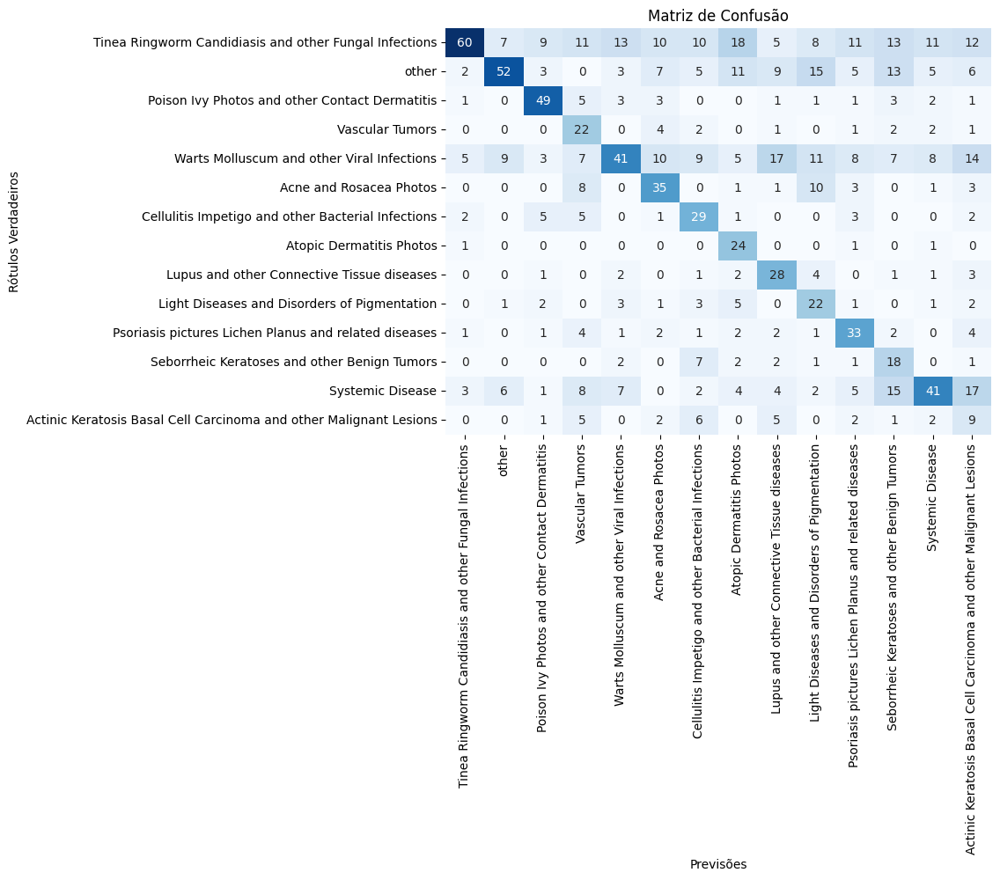

In [79]:
y_pred = resnet50_geral_ft.predict(x_test)
plot_confusion_matrix(np.argmax(y_pred,axis=-1),np.argmax(y_test,axis=-1),df_skin_disease['target'].unique())

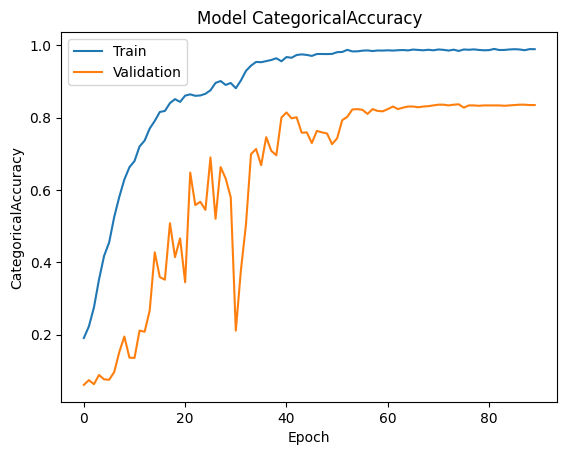

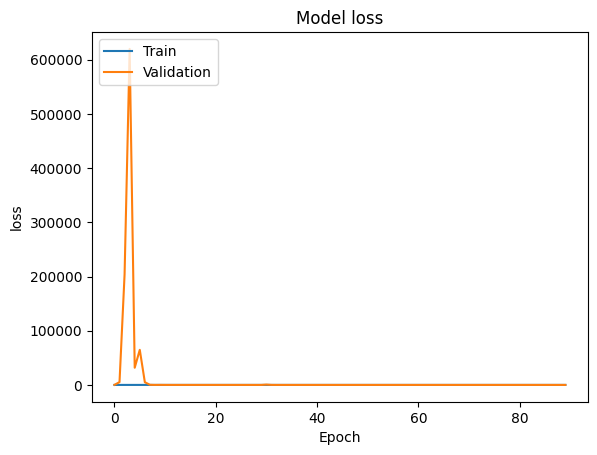

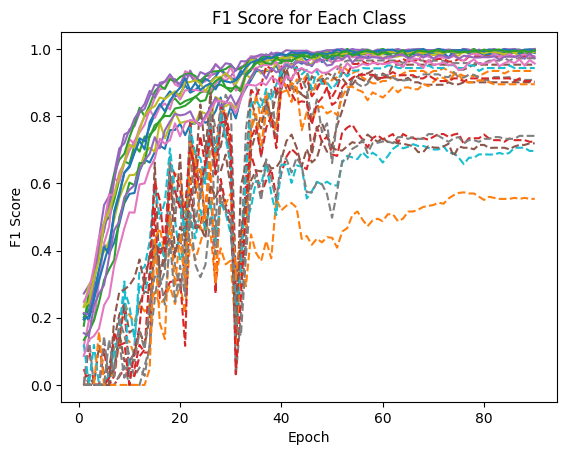

In [80]:
plot_loss_accuracy(history)
plot_f1(history,df_skin_disease['target'].unique(),False)

In [81]:
loss, acc, f1, recall = resnet50_geral_ft.evaluate(x_test, y_test)
print("loss: {}".format(loss))
print("acc: {}".format(acc))
print("f1: {}".format(f1))
print("recall: {}".format(recall))
gc.collect()

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - CategoricalAccuracy: 0.3994 - f1_score: 0.2476 - loss: 3.4548 - recall: 0.3716
loss: 3.144070863723755
acc: 0.4409523904323578
f1: [0.43956038 0.49289095 0.675862   0.39999992 0.35807857 0.51094884
 0.47154465 0.4705882  0.47457623 0.37931028 0.51162785 0.33027518
 0.43157887 0.16666661]
recall: 0.41999998688697815


39356

In [82]:
y_pred = resnet50_geral_ft.predict(x_test)
print_metrics_per_class(y_pred,y_test,data_train_raw['target'].unique())

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Tinea Ringworm Candidiasis and other Fungal Infections: Accuracy = 80.00%, Recall = 10.00%
other: Accuracy = 69.33%, Recall = 13.87%
Poison Ivy Photos and other Contact Dermatitis: Accuracy = 65.33%, Recall = 6.53%
Vascular Tumors: Accuracy = 29.33%, Recall = 3.26%
Warts Molluscum and other Viral Infections: Accuracy = 54.67%, Recall = 6.07%
Acne and Rosacea Photos: Accuracy = 46.67%, Recall = 4.67%
Cellulitis Impetigo and other Bacterial Infections: Accuracy = 38.67%, Recall = 3.52%
Atopic Dermatitis Photos: Accuracy = 32.00%, Recall = 2.91%
Lupus and other Connective Tissue diseases: Accuracy = 37.33%, Recall = 3.39%
Light Diseases and Disorders of Pigmentation: Accuracy = 29.33%, Recall = 2.93%
Psoriasis pictures Lichen Planus and related diseases: Accuracy = 44.00%, Recall = 3.38%
Seborrheic Keratoses and other Benign Tumors: Accuracy = 24.00%, Recall = 2.40%
Systemic Disease: Accuracy = 54.67%, Recall = 4.97%
Actinic Keratosis Basal Cell Carc

<h1>Transfer learning retreinando uma rede já treinada em dominio geral</h1>

In [83]:
resnet50_geral_tl = CustomResNet(num_classes=14, trained=True)
input_shape = (1, 100, 75, 3)  # (batch_size, height, width, channels)
resnet50_geral_tl.resnet.trainable = False
dummy_input = tf.zeros(input_shape)

# Chamar o modelo com o input fictício para inicializar as camadas
_ = resnet50_geral_tl(dummy_input)
resnet50_geral_tl.build(input_shape=(None, 100, 75, 3))


resnet50_geral_tl.summary()

Model: "custom_res_net_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ ?                      │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ ?                      │        98,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ ?                      │     6,291,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_out (Dense)               │ ?                      │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,981,326 (114.37 MB)

 Trainable params: 6,344,462 (24.20 MB)

 Non-trainable params: 23,636,864 (90.17 MB)

In [84]:

optimizer = tf.keras.optimizers.AdamW(learning_rate=0.001)
resnet50_geral_tl.compile(optimizer = optimizer,loss='categorical_crossentropy', metrics=default_metrics)



batch_size = 256
epochs = num_epochs

history = resnet50_geral_tl.fit(
    datagen.flow(x_train, y_train, batch_size=batch_size),
    epochs=epochs,
    validation_data=(x_val, y_val),
    verbose=1,
    callbacks=[callbacks]
)
resnet50_geral_tl.save(checkpoint_filepath + "resnet50_geral_tl.keras")

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - CategoricalAccuracy: 0.1836 - f1_score: 0.1775 - loss: 8.4135 - recall: 0.1031 - val_CategoricalAccuracy: 0.3020 - val_f1_score: 0.2819 - val_loss: 10.0876 - val_recall: 0.2806 - learning_rate: 0.0010
Epoch 2/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 27s 410ms/step - CategoricalAccuracy: 0.3375 - f1_score: 0.3354 - loss: 8.1397 - recall: 0.2742 - val_CategoricalAccuracy: 0.3041 - val_f1_score: 0.2975 - val_loss: 9.0605 - val_recall: 0.2796 - learning_rate: 0.0010
Epoch 3/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 420ms/step - CategoricalAccuracy: 0.4144 - f1_score: 0.4119 - loss: 7.6172 - recall: 0.3338 - val_CategoricalAccuracy: 0.3653 - val_f1_score: 0.3926 - val_loss: 8.0794 - val_recall: 0.3194 - learning_rate: 0.0010
Epoch 4/150
16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 406ms/step - CategoricalAccuracy: 0.4540 - f1_score: 0.4520 - loss: 7.0241 - recall: 0.3742 - val_CategoricalAccuracy: 0.4296 - val_f1_score: 0.4504 - val_loss: 7.1502 - val_recall: 0.3745 - learning_rat

33/33 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step


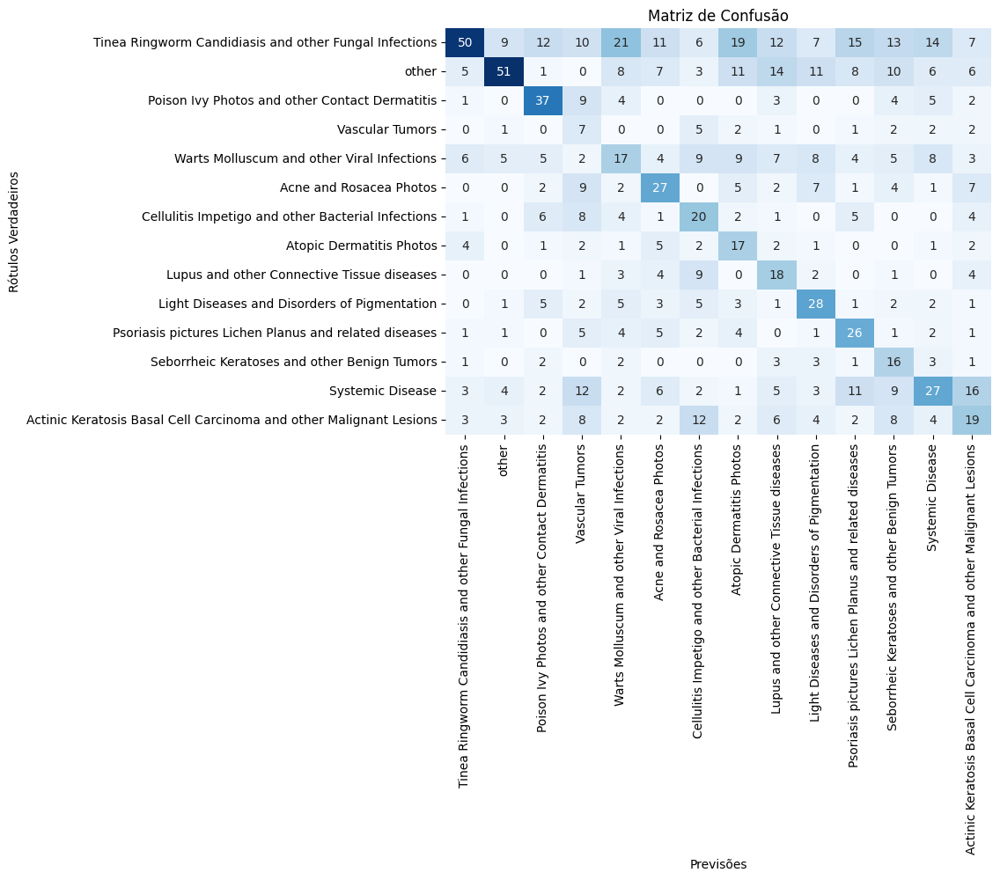

In [85]:
y_pred = resnet50_geral_tl.predict(x_test)
plot_confusion_matrix(np.argmax(y_pred,axis=-1),np.argmax(y_test,axis=-1),df_skin_disease['target'].unique())

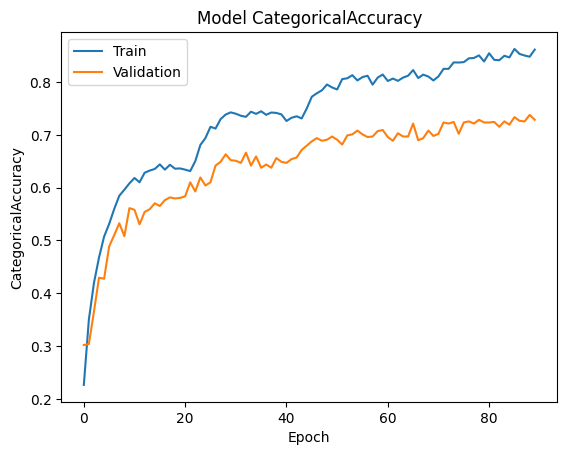

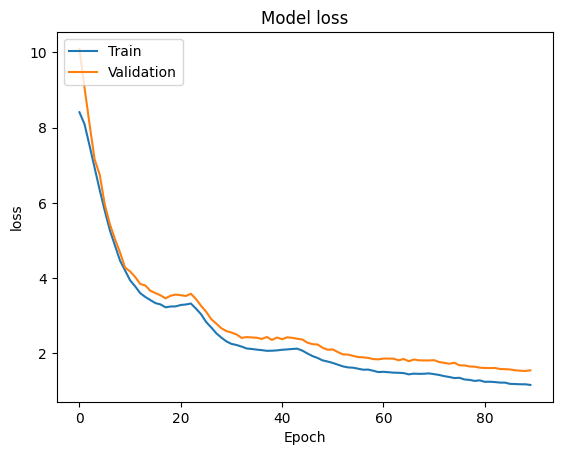

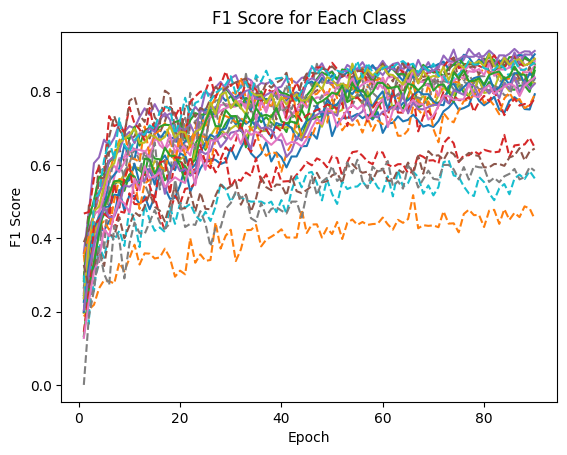

In [86]:
plot_loss_accuracy(history)
plot_f1(history,df_skin_disease['target'].unique(),False)

In [87]:
loss, acc, f1, recall = resnet50_geral_tl.evaluate(x_test, y_test)
print("loss: {}".format(loss))
print("acc: {}".format(acc))
print("f1: {}".format(f1))
print("recall: {}".format(recall))
gc.collect()

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - CategoricalAccuracy: 0.3177 - f1_score: 0.1945 - loss: 3.3644 - recall: 0.2398
loss: 3.297961711883545
acc: 0.34285715222358704
f1: [0.35587186 0.47222212 0.52857137 0.14285712 0.20359278 0.38028163
 0.3149606  0.30088493 0.30769226 0.4179104  0.40624997 0.29906535
 0.30337074 0.24999994]
recall: 0.2628571391105652


27476

In [88]:
y_pred = resnet50_geral_tl.predict(x_test)
print_metrics_per_class(y_pred,y_test,data_train_raw['target'].unique())

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Tinea Ringworm Candidiasis and other Fungal Infections: Accuracy = 66.67%, Recall = 6.67%
other: Accuracy = 68.00%, Recall = 8.50%
Poison Ivy Photos and other Contact Dermatitis: Accuracy = 49.33%, Recall = 4.48%
Vascular Tumors: Accuracy = 9.33%, Recall = 0.78%
Warts Molluscum and other Viral Infections: Accuracy = 22.67%, Recall = 1.74%
Acne and Rosacea Photos: Accuracy = 36.00%, Recall = 3.27%
Cellulitis Impetigo and other Bacterial Infections: Accuracy = 26.67%, Recall = 2.42%
Atopic Dermatitis Photos: Accuracy = 22.67%, Recall = 2.06%
Lupus and other Connective Tissue diseases: Accuracy = 24.00%, Recall = 1.85%
Light Diseases and Disorders of Pigmentation: Accuracy = 37.33%, Recall = 3.39%
Psoriasis pictures Lichen Planus and related diseases: Accuracy = 34.67%, Recall = 3.15%
Seborrheic Keratoses and other Benign Tumors: Accuracy = 21.33%, Recall = 1.78%
Systemic Disease: Accuracy = 36.00%, Recall = 3.00%
Actinic Keratosis Basal Cell Carcino

<h1>Rascunho</h1>

In [89]:
import cv2
def gradcam(model,imgs,cols, rows,title):
    resnet_model =  model.get_layer("resnet50")
    last_conv_layer = resnet_model.get_layer("conv5_block3_out")
    last_conv_layer_model = tf.keras.Model(resnet_model.inputs, last_conv_layer.output)
    classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for layer in model.layers:
        if layer.name != "resnet50":
            x = layer(x)
    classifier_model = tf.keras.Model(classifier_input, x)
    fig, axs = plt.subplots(rows,cols,figsize = (100,100))
    fig.suptitle(title, fontsize=160)
    n_row=0
    n_col=0
    for img in imgs:
        image = np.asarray(img.astype('uint8'))
        with tf.GradientTape() as tape:
            inputs = image[np.newaxis, ...]
            last_conv_layer_output = last_conv_layer_model(inputs)
            tape.watch(last_conv_layer_output)
            preds = classifier_model(last_conv_layer_output)
            top_pred_index = tf.argmax(preds[0])
            top_class_channel = preds[:, top_pred_index]
        grads = tape.gradient(top_class_channel, last_conv_layer_output)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        last_conv_layer_output = last_conv_layer_output.numpy()[0]
        pooled_grads = pooled_grads.numpy()
        for i in range(pooled_grads.shape[-1]):
            last_conv_layer_output[:, :, i] *= pooled_grads[i]
        # Average over all the filters to get a single 2D array
        gradcam = np.mean(last_conv_layer_output, axis=-1)
        # Clip the values (equivalent to applying ReLU)
        # and then normalise the values
        gradcam = np.clip(gradcam, 0, np.max(gradcam)) / np.max(gradcam)
        gradcam = cv2.resize(gradcam, (75, 100))

        axs[n_row,n_col].imshow(image)
        axs[n_row,n_col].imshow(gradcam, alpha=0.5)
        n_col+=1
        if n_col >= cols:
            n_col = 0
            n_row+=1
    plt.show()


In [90]:
imgs_idx = [0,100,250,350,450,550,650,750,850]
imgs_to_plot = []
for i in imgs_idx:
    imgs_to_plot.append(x_test[i])

In [91]:
fig, axs = plt.subplots(3,3,figsize = (100,100))
n_row=0
n_col=0
fig.suptitle("imagens", fontsize=160)
for image in imgs_to_plot:
    axs[n_row,n_col].imshow(np.asarray(image.astype('uint8')))
    n_col+=1
    if n_col >= 3:
        n_col = 0
        n_row+=1


In [99]:

gradcam(resnet50_no_train,imgs_to_plot,3,3,"do zero")


In [93]:
gradcam(resnet50_cancer_ft,imgs_to_plot,3,3,"fine tuning cancer")


In [94]:
gradcam(resnet50_cancer_tfl,imgs_to_plot,3,3,"transfer cancer")


In [95]:
gradcam(resnet50_geral_ft,imgs_to_plot,3,3,"fine tuning geral")


In [96]:
gradcam(resnet50_geral_tl,imgs_to_plot,3,3,"transfer geral")